# Data Analysis

Get some statistics about the curated data.

- sketch the datacuration process

- unique ligands?
- from PROTAC-DB? PROTAC-Pedia?
- how many heavy atoms?
- number of manually curated PROTACs?
- distributions:
  - of WH?
  - of E3?
  - Targets?
  - functional groups

- plan for the next three weeks in slides


- template generation
- literature review
  - 


  johan.jonasson@gu.se

## Setup and Imports

In [8]:
import os
import sys
import re
from hashlib import sha256
from typing import Optional, List, ClassVar, Any, Tuple, Dict
from collections import Counter

import numpy as np
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs, MACCSkeys, rdFMCS, Draw
from rdkit import RDLogger
from rdkit import rdBase

if 'ipykernel' in sys.modules:
    from tqdm.auto import tqdm  # for notebooks
    from IPython.display import display
    from rdkit.Chem.Draw import IPythonConsole
else:
    from tqdm import tqdm

# Import GetSubstructMatchesWithTimeout
sys.path.append(os.path.join(os.getcwd()))
from substruct_matches_wrapper import GetSubstructMatchesWithTimeout

def safe_display(*args):
    """Displays content only if running in a Jupyter notebook."""
    if 'ipykernel' in sys.modules:
        display(*args)
    else:
        print(*args)

# Disable the RDKit warnings that pop up when RDKit fails to create molecules
RDLogger.DisableLog("rdApp.*")
blocker = rdBase.BlockLogs()

data_dir = os.path.join(os.getcwd(), '..', 'data')
print(data_dir)

/Users/ribes/phd/PROTAC-Splitter/notebooks/../data


In [9]:
# Enable debug logging
import logging

logging.basicConfig(level=logging.INFO)

## Utility Functions

When splitting a PROTAC into its substructures, we are interested in labelling the "directionality" of the sub-structures, so that we can easily tell which substructure is the "warhead" (binding to the POI) and which is the "E3 ligand".

To this end, we now define and fix constant the IDs of the two attachment points:

In [10]:
POI_ATTACHMENT_ID = 1
E3_ATTACHMENT_ID = 2

Utility functions:

- `clean_smarts`: UNUSED.
- `canonicalize_smiles`: Canonize SMILES strings.
- `check_reassembly`: Check if the reassembly of the PROTAC is successful.
- `dummy2query`: This function is useful for getting substructure queries, _e.g._, matches, when dealing with SMILES with dummy atoms (which normally would match any atom instead).
- `remove_dummy_atoms`: Remove dummy atoms from a SMILES string. UNUSED.

In [11]:
def canonize_smarts(smarts: str) -> str:
    """
    Cleans a SMARTS string by converting it to canonical SMARTS representation.

    NOTE: It might not work for complex patterns: https://github.com/rdkit/rdkit/discussions/6929

    Args:
        smarts (str): The input SMARTS string.

    Returns:
        str: The cleaned SMARTS string.
    """
    mol = Chem.MolFromSmarts(smarts)

    if mol is None:
        return None
    canonical_smarts = Chem.MolToSmarts(Chem.MolFromSmiles(Chem.MolToSmiles(mol), sanitize=False))
    return canonical_smarts


def smiles2mol(smiles: str) -> Chem.Mol:
    """Converts a SMILES string to an RDKit molecule object.

    Args:
        smiles (str): The input SMILES string.

    Returns:
        Chem.Mol: The RDKit molecule object.
    """
    return Chem.MolFromSmiles(smiles)

def mol2smiles(mol: Chem.Mol) -> str:
    """Converts an RDKit molecule object to a SMILES string.

    Args:
        mol (Chem.Mol): The RDKit molecule object.

    Returns:
        str: The SMILES string.
    """
    return Chem.MolToSmiles(mol)

def canonize_smiles(smiles: str) -> str:
    """ Canonizes a SMILES string by converting it to canonical SMILES representation.
    
    Args:
        smiles (str): The input SMILES string.

    Returns:
        str: The canonized SMILES string.
    """
    if smiles is None:
        return None
    try:
        mol = Chem.MolFromSmiles(smiles)
    except Exception as e:
        print(f"Error: {e}")
        return None
    if mol is None:
        return None
    try:
        return Chem.MolToSmiles(mol, canonical=True)
    except:
        return None

def canonize(x: str | Chem.Mol) -> str | Chem.Mol:
    """ Canonizes a SMILES string or RDKit molecule object.

    Args:
        x: The input SMILES string or RDKit molecule object.

    Returns:
        str | Chem.Mol: The canonized SMILES string or RDKit molecule object, according to the input type.
    """
    if x is None:
        return None
    if isinstance(x, str):
        return canonize_smiles(x)
    return Chem.MolFromSmiles(Chem.MolToSmiles(x, canonical=True))

def dummy2query(mol: Chem.Mol) -> Chem.Mol:
    """ Converts dummy atoms to query atoms, so that a molecule with attachment points can be used in HasSubstructMatch.
    
    Args:
        mol: The molecule to convert.

    Returns:
        The molecule with dummy atoms converted to query atoms
    """
    if mol is None:
        return None
    p = Chem.AdjustQueryParameters.NoAdjustments()
    p.makeDummiesQueries = True
    return Chem.AdjustQueryProperties(mol, p)

def remove_dummy_atoms(mol: str | Chem.Mol, canonical=True) -> str | Chem.Mol:
    """
    Removes all dummy atoms (attachment points) from a molecule.
    
    Args:
        mol: RDKit Mol object with dummy atoms.

    Returns:
        A new RDKit Mol object without dummy atoms.
    """
    return_smiles = False
    if isinstance(mol, str):
        return_smiles = True
        mol = Chem.MolFromSmiles(mol)
    
    if mol is None:
        return None
    
    # Remove all dummy atoms with a query
    mol_no_dummy = Chem.DeleteSubstructs(mol, Chem.MolFromSmarts('[#0]'))

    if mol_no_dummy is None:
        # --------------------------------------------------------------------------
        # Other approach: editing molecule and removing dummy atoms
        # --------------------------------------------------------------------------
        # Create an editable molecule to remove atoms
        editable_mol = Chem.EditableMol(mol)
        
        # List of atoms to remove (dummy atoms have atomic number 0)
        dummy_atoms = [atom.GetIdx() for atom in mol.GetAtoms() if atom.GetAtomicNum() == 0]
        
        # Remove dummy atoms
        for atom_idx in sorted(dummy_atoms, reverse=True):  # Remove from the highest index to avoid index shifts
            editable_mol.RemoveAtom(atom_idx)
        
        if editable_mol is None:
            return None

        # Return the modified molecule
        if return_smiles:
            return Chem.MolToSmiles(editable_mol.GetMol())
        editable_mol = editable_mol.GetMol()
        editable_mol.UpdatePropertyCache()
        return editable_mol
        # --------------------------------------------------------------------------

    # Return the modified molecule
    if return_smiles:
        return Chem.MolToSmiles(mol_no_dummy, canonical=canonical)
    return mol_no_dummy

def get_mol_id(smiles: str) -> str | None:
    """ Get the Hash of a given SMILES string.
    
    Args:
        smiles (str): The SMILES string to hash.

    Returns:
        str | None: The Hash of the SMILES string. None if the function failed.
    """
    if smiles is None:
        print("Error: SMILES is None.")
        return None
    try:
        mol = Chem.MolFromSmiles(smiles)
    except Exception as e:
        print(f"Error: {e}")
        print(f"SMILES: {smiles}")
        return None
    if mol is None:
        return None
    # Remove stereochemistry from the molecule
    try:
        Chem.RemoveStereochemistry(mol)
    except:
        print(f"ERROR removing stereochemistry from molecule. The molecule with stereochemistry will be used to calculate the ID. SMILES: {smiles}")
        return None
    # Get the InChIKey for the molecule
    mol = canonize(mol)
    # inchi_key = Chem.MolToInchiKey(remove_dummy_atoms(mol))
    smiles = Chem.MolToSmiles(mol, canonical=True)
    return sha256((smiles).encode()).hexdigest()

print(remove_dummy_atoms("[*:2]CCOCCOC[*:1]"))
print(remove_dummy_atoms("[*:2]CCOCCOCC(=O)[*:1]"))
print(get_mol_id("[*:2]CCOCCOC[*:1]"))
print(get_mol_id("[*:2]CCOCCOCC(=O)[*:1]"))
print(get_mol_id(canonize("Cc1ncsc1-c1ccc2c(c1)OCCOC[C@@H](NC(=O)C[C@@H]1N=C(c3ccc(Cl)cc3)c3c(sc(C)c3C)-n3c(C)nnc31)COCCOCCOCC(=O)N[C@@H](C(C)(C)C)C(=O)N1C[C@H](O)C[C@H]1C(=O)NC2")))
print('''\nbb5501abafb70c9ac318276ae85579465d3875e35016991c900bd615b747f9d0
5531d10c5caa47f340ea1b5be2d1bc8715797ab6e5450d921432e65d4254a918
2b95b0bb161088f1400d968f977b0a227e346a206bdadcda8b3df6578e7e0ddb''')

CCOCCOC
CCOCCOCC=O
bb5501abafb70c9ac318276ae85579465d3875e35016991c900bd615b747f9d0
5531d10c5caa47f340ea1b5be2d1bc8715797ab6e5450d921432e65d4254a918
60a98011a8cc916614860373e5854d49411c7e1e4f4bd3f6aad408d5de796622

bb5501abafb70c9ac318276ae85579465d3875e35016991c900bd615b747f9d0
5531d10c5caa47f340ea1b5be2d1bc8715797ab6e5450d921432e65d4254a918
2b95b0bb161088f1400d968f977b0a227e346a206bdadcda8b3df6578e7e0ddb


### Display Functions

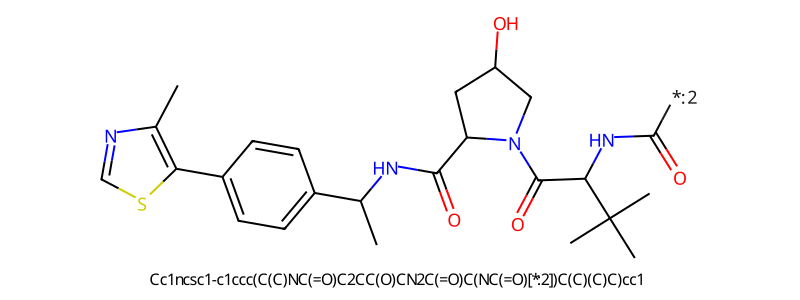

ID: 1
PROTAC: Cc1ncsc1-c1ccc(C(C)NC(=O)C2CC(O)CN2C(=O)C(NC(=O)COCCOCCOCCOCCOCCOc2ccc(C=NNC(=O)c3ccc(Oc4c(-c5ccc(O)cc5)sc5cc(O)ccc45)cc3)cc2)C(C)(C)C)cc1
POI: Oc1ccc(-c2sc3cc(O)ccc3c2Oc2ccc([*:1])cc2)cc1
Linker: O=C(NN=Cc1ccc(OCCOCCOCCOCCOCCOC[*:2])cc1)[*:1]
E3: Cc1ncsc1-c1ccc(C(C)NC(=O)C2CC(O)CN2C(=O)C(NC(=O)[*:2])C(C)(C)C)cc1


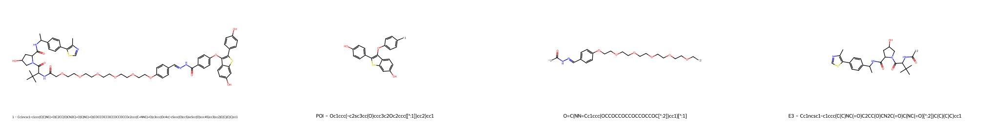

In [12]:
def display_mol(
        mol: Chem.Mol,
        w: int = 800,
        h: int = 300,
        legend: Optional[str] = None,
        use_smiles_as_legend: bool = True,
        display_svg: bool = True,
):
    """ Display a molecule in a Jupyter notebook. Useful for having """
    if mol is None:
        print('Molecule is None')
        return None
    if use_smiles_as_legend and legend is None:
        legend = Chem.MolToSmiles(mol)
    if display_svg:
        mol.SetProp("_Name", Chem.MolToSmiles(mol, canonical=True))
        d = Draw.rdMolDraw2D.MolDraw2DSVG(w, h, noFreetype=True)
        font_path = '/System/Library/Fonts/Supplemental/Arial.ttf'
        if os.path.exists(font_path):
            d.fontFile = font_path
        d.DrawMolecule(mol, legend=legend)
        d.FinishDrawing()
        svg = d.GetDrawingText()
        # Check if in Jupyter notebook
        if sys.modules.get('ipykernel', None):
            from IPython.display import SVG
            safe_display(SVG(svg))
    else:
        img = Draw.MolToImage(mol, size=(w, h))
        safe_display(img)

def display_protac_substructures(
        protac_smiles: str,
        poi_smiles: str,
        linker_smiles: str,
        e3_smiles: str,
        compound_id: Optional[int] = None,
        print_smiles: bool = False,
        grid_to_image_kwargs: Dict[str, Any] = {'molsPerRow': 4, 'subImgSize': (1000, 500), 'useSVG': False},
):
    """ Display the substructures of a PROTAC molecule.
    
    Args:
        protac_smiles: The SMILES of the PROTAC molecule.
        poi_smiles: The SMILES of the POI ligand.
        linker_smiles: The SMILES of the linker molecule.
        e3_smiles: The SMILES of the E3 binder.
        compound_id: The compound ID.
        print_smiles: Whether to print the SMILES strings.
        grid_to_image_kwargs: The arguments to pass to the Draw function.
    """
    protac_smiles = canonize(protac_smiles)
    e3_smiles = canonize(e3_smiles)
    poi_smiles = canonize(poi_smiles)
    linker_smiles = canonize(linker_smiles)

    # Get the non-None molecules and their respective legends
    mols = []
    legends = []
    for name, smiles in zip([f'{compound_id} - ', 'POI - ', '', 'E3 - '], [protac_smiles, poi_smiles, linker_smiles, e3_smiles]):
        if smiles is not None:
            l = f'{name}{smiles}'
            legends.append(l)
            mols.append(Chem.MolFromSmiles(smiles))

    legends = grid_to_image_kwargs.pop('legends', legends)
    molsPerRow = grid_to_image_kwargs.pop('molsPerRow', 4)

    img = Draw.MolsToGridImage(
        mols,
        legends=legends,
        molsPerRow=molsPerRow,
        **grid_to_image_kwargs,
    )

    if print_smiles:
        print(f'ID: {compound_id}')
        print(f'PROTAC: {protac_smiles}')
        print(f'POI: {poi_smiles}')
        print(f'Linker: {linker_smiles}')
        print(f'E3: {e3_smiles}')
    safe_display(img)


protac_smiles = canonize('Cc1ncsc1-c1ccc(C(C)NC(=O)C2CC(O)CN2C(=O)C(NC(=O)COCCOCCOCCOCCOCCOc2ccc(C=NNC(=O)c3ccc(Oc4c(-c5ccc(O)cc5)sc5cc(O)ccc45)cc3)cc2)C(C)(C)C)cc1')
poi_smiles = canonize('Oc1ccc(-c2sc3cc(O)ccc3c2Oc2ccc([*:1])cc2)cc1')
linker_smiles = canonize('O=C(NN=Cc1ccc(OCCOCCOCCOCCOCCOC[*:2])cc1)[*:1]')
e3_smiles = canonize('Cc1ncsc1-c1ccc(C(C)NC(=O)C2CC(O)CN2C(=O)C(NC(=O)[*:2])C(C)(C)C)cc1')

display_mol(Chem.MolFromSmiles(e3_smiles))
# display_mol(Chem.MolFromSmiles(linker_smiles))
display_protac_substructures(protac_smiles, poi_smiles, linker_smiles, e3_smiles, compound_id=1, print_smiles=True, grid_to_image_kwargs={'molsPerRow': 4, 'subImgSize': (800, 400), 'useSVG': True})

## Load "Raw" Datasets

From [PROTAC-DB paper](https://academic.oup.com/nar/article/49/D1/D1381/5917660?login=false#:~:text=For%20linkers%2C%20only%20the%202D%20structures%2C%20compound%20IDs%20and%20targeted%20proteins%20are%20shown%20in%20the%20datasheet.%20The%20%E2%80%98R1%E2%80%99%20and%20%E2%80%98R2%E2%80%99%20in%20the%20structures%20represent%20the%20sites%20that%20conjugate%20warheads%20and%20E3%20ligands%2C%20respectively.):

> For linkers, only the 2D structures, compound IDs and targeted proteins are shown in the datasheet. The ‘R1’ and ‘R2’ in the structures represent the sites that conjugate warheads and E3 ligands, respectively.

In [13]:
protac_pedia_df = pd.read_csv(os.path.join(data_dir, 'raw', 'PROTAC-Pedia.csv')).reset_index(drop=True)
protac_db_df = pd.read_csv(os.path.join(data_dir, 'raw', 'PROTAC-DB.csv')).reset_index(drop=True)
protac_db_linker_df = pd.read_csv(os.path.join(data_dir, 'raw', 'PROTAC-DB-Linkers.csv')).reset_index(drop=True)
protac_db_e3_df = pd.read_csv(os.path.join(data_dir, 'raw', 'PROTAC-DB-E3-Ligands.csv')).reset_index(drop=True)
protac_db_poi_df = pd.read_csv(os.path.join(data_dir, 'raw', 'PROTAC-DB-Warheads.csv')).reset_index(drop=True)

# Rename columns to make them consistent across all dataframes
protac_pedia_df = protac_pedia_df.rename(columns={
    'Linker': 'Linker SMILES',
    'Ligand SMILES': 'POI Ligand SMILES',
    'Target': 'Uniprot',
    'Ligand PDB': 'Target',
})
protac_db_df = protac_db_df.rename(columns={
    'Smiles': 'PROTAC SMILES',
    'E3 ligase': 'E3 Ligase',
})
protac_db_linker_df = protac_db_linker_df.rename(columns={'Smiles': 'Linker SMILES', 'Smiles_R': 'Linker SMARTS'})
protac_db_e3_df = protac_db_e3_df.rename(columns={'Smiles': 'E3 Binder SMILES'})
protac_db_poi_df = protac_db_poi_df.rename(columns={'Smiles': 'POI Ligand SMILES'})

# Replace the attachment points in the linker SMARTS with the ones we defined
protac_db_linker_df['Linker SMARTS'] = protac_db_linker_df['Linker SMARTS'].str.replace('[R1]', f'[*:{POI_ATTACHMENT_ID}]')
protac_db_linker_df['Linker SMARTS'] = protac_db_linker_df['Linker SMARTS'].str.replace('[R2]', f'[*:{E3_ATTACHMENT_ID}]')

# Canonize all the SMILES strings
tqdm.pandas(desc='Canonizing SMILES')
protac_pedia_df['PROTAC SMILES'] = protac_pedia_df['PROTAC SMILES'].progress_apply(canonize_smiles)
protac_db_df['PROTAC SMILES'] = protac_db_df['PROTAC SMILES'].progress_apply(canonize_smiles)
protac_db_linker_df['Linker SMILES'] = protac_db_linker_df['Linker SMILES'].progress_apply(canonize_smiles)
protac_db_linker_df['Linker SMARTS'] = protac_db_linker_df['Linker SMARTS'].progress_apply(canonize_smiles)
protac_db_e3_df['E3 Binder SMILES'] = protac_db_e3_df['E3 Binder SMILES'].progress_apply(canonize_smiles)
protac_db_poi_df['POI Ligand SMILES'] = protac_db_poi_df['POI Ligand SMILES'].progress_apply(canonize_smiles)

# Add a "PROTAC ID" column based on the get_mol_id function
tqdm.pandas(desc='Adding PROTAC ID')
protac_pedia_df['PROTAC ID'] = protac_pedia_df['PROTAC SMILES'].progress_apply(get_mol_id)
protac_db_df['PROTAC ID'] = protac_db_df['PROTAC SMILES'].progress_apply(get_mol_id)

# Drop rows with invalid SMILES
protac_db_df = protac_db_df.dropna(subset=['PROTAC SMILES'])
protac_db_linker_df = protac_db_linker_df.dropna(subset=['Linker SMILES', 'Linker SMARTS'], how='all')
protac_db_e3_df = protac_db_e3_df.dropna(subset=['E3 Binder SMILES'])
protac_db_poi_df = protac_db_poi_df.dropna(subset=['POI Ligand SMILES'])

print('')
print('Listing unique compound IDs according to PROTAC-DB:')
print(f'protac_db_df:        {len(protac_db_df['Compound ID'].unique()):5,d}')
print(f'protac_db_poi_df:    {len(protac_db_poi_df['Compound ID'].unique()):5,d}')
print(f'protac_db_linker_df: {len(protac_db_linker_df['Compound ID'].unique()):5,d}')
print(f'protac_db_e3_df:     {len(protac_db_e3_df['Compound ID'].unique()):5,d}')

print('')
print(f'Number of unique PROTAC SMILES in PROTAC-DB:     {len(protac_db_df["PROTAC SMILES"].unique()):5,d}')
print(f'Number of unique POI Ligand SMILES in PROTAC-DB: {len(protac_db_poi_df["POI Ligand SMILES"].unique()):5,d}')
print(f'Number of unique E3 Binder SMILES in PROTAC-DB:  {len(protac_db_e3_df["E3 Binder SMILES"].unique()):5,d}')
print(f'Number of unique Linker SMILES in PROTAC-DB:     {len(protac_db_linker_df["Linker SMILES"].unique()):5,d}')
print(f'Number of unique Linker SMARTS in PROTAC-DB:     {len(protac_db_linker_df["Linker SMARTS"].unique()):5,d}')

print('')
print(f'Number of unique PROTAC SMILES in PROTAC-Pedia:     {len(protac_pedia_df["PROTAC SMILES"].unique()):5,d}')
print(f'Number of unique POI Ligand SMILES in PROTAC-Pedia: {len(protac_pedia_df["POI Ligand SMILES"].unique()):5,d}')
print(f'Number of unique E3 Binder SMILES in PROTAC-Pedia:  {len(protac_pedia_df["E3 Binder SMILES"].unique()):5,d}')
print(f'Number of unique Linker SMILES in PROTAC-Pedia:     {len(protac_pedia_df["Linker SMILES"].unique()):5,d}')

Adding PROTAC ID: 100%|██████████| 5388/5388 [00:02<00:00, 1806.56it/s]


Listing unique compound IDs according to PROTAC-DB:
protac_db_df:        3,270
protac_db_poi_df:      569
protac_db_linker_df: 2,749
protac_db_e3_df:       107

Number of unique PROTAC SMILES in PROTAC-DB:     3,270
Number of unique POI Ligand SMILES in PROTAC-DB:   569
Number of unique E3 Binder SMILES in PROTAC-DB:    107
Number of unique Linker SMILES in PROTAC-DB:     2,490
Number of unique Linker SMARTS in PROTAC-DB:     2,749

Number of unique PROTAC SMILES in PROTAC-Pedia:     1,178
Number of unique POI Ligand SMILES in PROTAC-Pedia:   183
Number of unique E3 Binder SMILES in PROTAC-Pedia:     69
Number of unique Linker SMILES in PROTAC-Pedia:       664


In [14]:
safe_display(protac_db_df.describe().T)
safe_display(protac_pedia_df.describe().T)

,count,mean,std,min,25%,50%,75%,max
Compound ID,5388.0,1707.189310,899.824467,1.000000,937.000000,1956.000000,2342.000000,3270.000000
"kon (1/Ms, Protac to Target)",3.0,163334.400000,282900.708143,1.400000,1.600000,1.800000,245000.900000,490000.000000
"koff (1/s, Protac to Target)",3.0,0.395000,0.377525,0.015000,0.207500,0.400000,0.585000,0.770000
"t1/2 (s, Protac to Target)",0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"EC50 (nM, Protac to E3)",3.0,640.000000,63.505905,576.000000,608.500000,641.000000,672.000000,703.000000
"Ki (nM, Protac to E3)",18.0,222.000000,189.363330,33.000000,72.000000,143.500000,450.000000,490.000000
"delta G (kcal/mol, Protac to E3)",43.0,-11.448140,7.342265,-37.900000,-9.790000,-9.500000,-9.340000,-8.490000
"delta H (kcal/mol, Protac to E3)",43.0,-7.844186,4.086635,-21.000000,-7.900000,-6.870000,-5.720000,-4.070000
"-T*delta S (kcal/mol, Protac to E3)",43.0,-3.608837,4.067692,-17.000000,-3.700000,-3.300000,-2.020000,4.900000
"kon (1/Ms, Protac to E3)",7.0,501428.571429,219349.688202,270000.000000,270000.000000,600000.000000,700000.000000,700000.000000


,count,mean,std,min,25%,50%,75%,max
PROTACDB ID,1203.0,6.070515e+02,3.514783e+02,1.000000e+00,3.015000e+02,6.080000e+02,9.105000e+02,1.215000e+03
cLogP,1203.0,5.664150e+00,2.880925e+00,-3.028200e+00,3.851700e+00,5.580080e+00,7.572470e+00,1.435562e+01
Hbond acceptors,1203.0,1.426766e+01,3.138221e+00,4.000000e+00,1.200000e+01,1.400000e+01,1.600000e+01,3.500000e+01
Hbond donors,1203.0,4.438071e+00,1.466809e+00,1.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00,1.000000e+01
linker_ha,1203.0,1.268412e+01,5.859700e+00,0.000000e+00,8.000000e+00,1.200000e+01,1.700000e+01,3.600000e+01
linker_no,1203.0,3.770574e+00,2.383505e+00,0.000000e+00,2.000000e+00,4.000000e+00,5.000000e+00,1.300000e+01
linker_rb,1203.0,7.708229e+00,5.032059e+00,0.000000e+00,4.000000e+00,7.000000e+00,1.100000e+01,2.900000e+01
MW,1203.0,1.001248e+03,1.892611e+02,3.822510e+02,8.878700e+02,9.929860e+02,1.087037e+03,1.963153e+03
Pubmed,1199.0,3.113021e+07,1.662822e+06,1.875294e+07,3.060396e+07,3.174752e+07,3.218404e+07,3.401866e+07
Secondary Pubmed,84.0,2.854837e+07,2.619095e+06,2.504794e+07,2.504794e+07,2.841863e+07,3.171513e+07,3.306216e+07


In [15]:
# Print all the columns in the PROTAC-DB dataframe and the PROTAC-Pedia dataframe
print('PROTAC-DB columns:')
print(protac_db_df.columns)
print('')
print('PROTAC-Pedia columns:')
print(protac_pedia_df.columns)

PROTAC-DB columns:
Index(['Compound ID', 'Uniprot', 'Target', 'E3 Ligase', 'PDB', 'Name',
       'PROTAC SMILES', 'DC50 (nM)', 'Dmax (%)', 'Assay (DC50/Dmax)',
       'Percent degradation (%)', 'Assay (Percent degradation)',
       'IC50 (nM, Protac to Target)', 'Assay (Protac to Target, IC50)',
       'EC50 (nM, Protac to Target)', 'Assay (Protac to Target, EC50)',
       'Kd (nM, Protac to Target)', 'Assay (Protac to Target, Kd)',
       'Ki (nM, Protac to Target)', 'Assay (Protac to Target, Ki)',
       'delta G (kcal/mol, Protac to Target)',
       'delta H (kcal/mol, Protac to Target)',
       '-T*delta S (kcal/mol, Protac to Target)',
       'Assay (Protac to Target, G/H/-TS)', 'kon (1/Ms, Protac to Target)',
       'koff (1/s, Protac to Target)', 't1/2 (s, Protac to Target)',
       'Assay (Protac to Target, kon/koff/t1/2)', 'IC50 (nM, Protac to E3)',
       'Assay (Protac to E3, IC50)', 'EC50 (nM, Protac to E3)',
       'Assay (Protac to E3, EC50)', 'Kd (nM, Protac to E3)',
   

In [16]:
protac_pedia_df[['Target', 'Uniprot', 'Off Targets Reported']]

,Target,Uniprot,Off Targets Reported
0,4QNQ,Q07817,No degradation of BCL2
1,4QNQ,Q07817,No degradation of BCL2
2,4QNQ,Q07817,No degradation of BCL2
3,4QNQ,Q07817,No degradation of BCL2
4,4QNQ,Q07817,No degradation of BCL2
...,...,...,...
1198,5J8O,Q9NZQ7,No
1199,5J8O,Q9NZQ7,No
1200,5J8O,Q9NZQ7,No
1201,NaN,P14174,NaN


In [17]:
# Use Uniprot APIs to get the gene names of the PROTAC-Pedia targets
import requests
import json

def get_gene_name(uniprot_id):
    """
    Fetch the gene name for a given UniProt ID using the UniProt API.
    
    Parameters:
        uniprot_id (str): The UniProt ID of the protein.
    
    Returns:
        str: The gene name if available, or a message indicating it was not found.
    """
    url = f"https://rest.uniprot.org/uniprotkb/{uniprot_id}"
    headers = {"Accept": "application/json"}
    
    response = requests.get(url, headers=headers)
    
    if response.status_code == 200:
        data = response.json()
        gene_name = data.get('genes', [{}])[0].get('geneName', {}).get('value')
        return gene_name if gene_name else "Gene name not found"
    elif response.status_code == 404:
        return "UniProt ID not found"
    else:
        print(f"Error: Unable to fetch data (status code: {response.status_code})")
        return None

# Get the gene names of the PROTAC-Pedia targets
uniprots = []
for uniprot in protac_pedia_df['Uniprot'].unique():
    if ',' in uniprot:
        uniprots.extend(uniprot.replace(' ', '').split(','))
    else:
        uniprots.append(uniprot)

if os.path.exists(os.path.join(data_dir, 'processed', 'uniprot2gene.json')):
    with open(os.path.join(data_dir, 'processed', 'uniprot2gene.json'), 'r') as f:
        uniprot2gene = json.load(f)
else:
    uniprot2gene = {}
    for uniprot in uniprots:
        gene_name = get_gene_name(uniprot)
        print(f'{uniprot}: {gene_name}')
        uniprot2gene[uniprot] = gene_name
    
    with open(os.path.join(data_dir, 'processed', 'uniprot2gene.json'), 'w') as f:
        json.dump(uniprot2gene, f, indent=4)

In [18]:
def map_target(row):
    """ Map the target to the gene name. """
    uniprots = row['Uniprot'].replace(' ', '').split(',')
    targets = set()
    for uniprot in uniprots:
        gene_name = uniprot2gene.get(uniprot, "Gene name not found")
        targets.add(gene_name)
    return ', '.join(sorted(targets))

def clean_target(row):
    targets = []
    for target in row['Target'].split(' '):
        targets.extend(target.split('/'))
    return ', '.join(sorted(targets))

map_target(protac_pedia_df.iloc[0])
map_target(protac_pedia_df.iloc[107])

# protac_pedia_df['Target'] = protac_pedia_df.apply(map_target, axis=1)
# protac_pedia_df['Target']

print(protac_pedia_df.apply(map_target, axis=1).unique())
print('-' * 80)
print(protac_db_df.apply(clean_target, axis=1).unique())

protac_db_df['Target'] = protac_db_df.apply(clean_target, axis=1)
protac_pedia_df['Target'] = protac_pedia_df.apply(map_target, axis=1)

['BCL2L1' 'EGFR' 'IRAK4' 'ABL1' 'ESRRA' 'NTRK3' 'BRD2, BRD3, BRD4'
 'BRD4, PLK1' 'JAK1, JAK2' 'JAK1, JAK2, JAK3'
 'AAK1, AURKB, BLK, Btk, CDK12, CDK13, CDK17, CDK2, CDK4, CDK5RAP1, CDK6, CDK7, CDK9, FER, FES, FLT3, GAK, ITK, LCK, LIMK2, MARK2, PRKAA1, PTK2, PTK2B, TEC, ULK1, WEE1, aurka-a'
 'FLT3' 'BTK' 'TBK1' 'SIRT2' 'CDK9' 'RIPK2' 'BRD4' 'FKBP1A' 'BRD9' 'MCL1'
 'SMARCA2, SMARCA4' 'Akt1' 'CDK2, CDK9' 'EED, EZH2, SUZ12' 'PDE6D' 'AR'
 'ESR1' 'HDAC6' 'CDK4, CDK6' 'CDK6' 'ALK' 'CYP1B1' 'KAT2A, KAT2B' 'PTK2'
 'EED' 'BAD, MCL1' 'CRBN' 'PARP1' 'MAPK13, MAPK14' 'SGK3' 'ESRRG' 'BRAF'
 'BCL6' 'EGFR, ERBB2' 'MET' 'CDC20' 'BRD7, BRD9' 'STAT3' 'MDM2' 'KRAS'
 'BRD2, BRD4' 'BET1' 'MAP2K1, MAP2K2' 'IGF1R, SRC' 'EEF2K' 'IDO1'
 'HDAC1, HDAC2, HDAC3' 'ZFP91' 'PTPN11' 'BRD3, BRD4' 'VHL' 'CSNK2A1'
 'SLC9A1' 'HTT' 'CDK4' 'PTK2, PTK2B' 'CRABP2' 'RARA' 'BIRC2, CRABP2'
 'MAPK14' 'MAPK13' 'PIK3CA' 'EIF4E' 'WEE1' 'HMGCR' 'CD274' 'MIF' 'PPIA']
---------------------------------------------------------------------

## Load Curated Dataset

In [19]:
# Load the data
mapped_df = pd.read_csv(os.path.join(data_dir, 'processed', 'mapped_protacs.csv')).reset_index(drop=True)
manually_df = pd.read_csv(os.path.join(data_dir, 'processed', 'manually_mapped_protacs.csv')).reset_index(drop=True)

# Merge the data
curated_df = pd.concat([mapped_df, manually_df], ignore_index=True).drop_duplicates().reset_index(drop=True)

# Remove all entries with empty linker, i.e., equal to "[*:1][*:2]" or "[*:2][*:1]"
curated_df = curated_df[~curated_df['Linker SMILES with direction'].isin(["[*:1][*:2]", "[*:2][*:1]"])]

print(curated_df.describe().T['unique'].to_csv())

,unique
PROTAC SMILES,5672
POI Ligand SMILES with direction,875
E3 Binder SMILES with direction,251
Linker SMILES with direction,1920
POI Ligand SMILES,855
E3 Binder SMILES,236
Linker SMILES,1772
PROTAC ID,3441
POI Ligand ID,642
E3 Binder ID,140
Linker ID,1780
Notes,77



In [20]:
# Apply the get_mol_id to the PROTAC SMILES, POI Ligand SMILES, Linker SMILES, and E3 Binder SMILES columns
tqdm.pandas(desc='Adding PROTAC ID')
curated_df['PROTAC ID'] = curated_df['PROTAC SMILES'].progress_apply(get_mol_id)
curated_df['POI Ligand ID'] = curated_df['POI Ligand SMILES'].progress_apply(get_mol_id)
curated_df['Linker ID'] = curated_df['Linker SMILES'].progress_apply(get_mol_id)
curated_df['E3 Binder ID'] = curated_df['E3 Binder SMILES'].progress_apply(get_mol_id)

Adding PROTAC ID: 100%|██████████| 5672/5672 [00:01<00:00, 4987.21it/s]


In [21]:
# Add a `Database` column to `curated_df` based on `PROTAC SMILES`: if it appears in `protac_db_df`, mark the column with "PROTAC-DB", if it appears in `protac_pedia_df`, then mark it "PROTAC-Pedia", if it appears in both, mark it "PROTAC-DB and PROTAC-Pedia".

# Check if PROTAC SMILES are in protac_db_df and protac_pedia_df
in_protac_db = curated_df['PROTAC ID'].isin(protac_db_df['PROTAC ID'])
in_protac_pedia = curated_df['PROTAC ID'].isin(protac_pedia_df['PROTAC ID'])

# Create the Database column based on the conditions
curated_df['Database'] = None
curated_df.loc[in_protac_db & in_protac_pedia, 'Database'] = 'PROTAC-DB and PROTAC-Pedia'
curated_df.loc[in_protac_db & ~in_protac_pedia, 'Database'] = 'PROTAC-DB'
curated_df.loc[~in_protac_db & in_protac_pedia, 'Database'] = 'PROTAC-Pedia'

# Get the None values in the `Database` column
curated_df['Database'].isnull().sum()

np.int64(0)

In [22]:
# Create a `Target` column that based on the database, contains the `Target` column of the respective database.
def get_target(row):
    if row['Database'] == 'PROTAC-DB':
        target = set(protac_db_df[protac_db_df['PROTAC SMILES'] == row['PROTAC SMILES']]['Target'].values)
        if len(target) == 0:
            target = set(protac_db_df[protac_db_df['PROTAC ID'] == row['PROTAC ID']]['Target'].values)
        # Concatenate all the targets if there are multiple
        row['Target'] = ', '.join(sorted(target))
        row['Number of Targets'] = len(target)
    elif row['Database'] == 'PROTAC-Pedia':
        target = set(protac_pedia_df[protac_pedia_df['PROTAC SMILES'] == row['PROTAC SMILES']]['Target'].values)
        if len(target) == 0:
            target = set(protac_pedia_df[protac_pedia_df['PROTAC ID'] == row['PROTAC ID']]['Target'].values)
        # Concat all the targets if there are multiple
        row['Target'] = ', '.join(sorted(target))
        row['Number of Targets'] = len(target)
    elif row['Database'] == 'PROTAC-DB and PROTAC-Pedia':
        target_db = set(protac_db_df[protac_db_df['PROTAC SMILES'] == row['PROTAC SMILES']]['Target'].values)
        # target_db = list(target_db)[0] if len(target_db) == 0 else ', '.join(sorted(target_db))
        if len(target_db) == 0:
            target_db = set(protac_db_df[protac_db_df['PROTAC ID'] == row['PROTAC ID']]['Target'].values)
        target_db = ', '.join(sorted(target_db))

        target_pedia = set(protac_pedia_df[protac_pedia_df['PROTAC SMILES'] == row['PROTAC SMILES']]['Target'].values)
        if len(target_pedia) == 0:
            target_pedia = set(protac_pedia_df[protac_pedia_df['PROTAC ID'] == row['PROTAC ID']]['Target'].values)
        target_pedia = ', '.join(sorted(target_pedia))

        if target_db == target_pedia:
            row['Target'] = target_db
            row['Number of Targets'] = 1
        else:
            row['Target'] = f'PROTAC-DB: {target_db} - PROTAC-Pedia: {target_pedia}'
            row['Number of Targets'] = len(target_db) + len(target_pedia)
    return row

tqdm.pandas(desc='Adding Target')
curated_df = curated_df.progress_apply(get_target, axis=1)

# Create a `E3 Ligase` column that based on the database, contains the `E3 Ligase` column of the respective database.
def get_e3_ligase(row):
    if row['Database'] == 'PROTAC-DB':
        return protac_db_df[protac_db_df['PROTAC ID'] == row['PROTAC ID']]['E3 Ligase'].values[0]
    if row['Database'] == 'PROTAC-Pedia':
        return protac_pedia_df[protac_pedia_df['PROTAC ID'] == row['PROTAC ID']]['E3 Ligase'].values[0]
    return None

tqdm.pandas(desc='Adding E3 Ligase')
curated_df['E3 Ligase'] = curated_df.progress_apply(get_e3_ligase, axis=1)
# Rename some E3 Ligase values to make them consistent
curated_df['E3 Ligase'] = curated_df['E3 Ligase'].str.replace('Cereblon', 'CRBN')
curated_df['E3 Ligase'] = curated_df['E3 Ligase'].str.replace('Iap', 'IAP')
curated_df['E3 Ligase'] = curated_df['E3 Ligase'].str.replace('Mdm2', 'MDM2')

safe_display(curated_df['Database'].value_counts())
safe_display(curated_df['Target'].value_counts())
safe_display(curated_df['E3 Ligase'].value_counts())

Adding E3 Ligase: 100%|██████████| 5672/5672 [00:00<00:00, 7639.86it/s] 


Database
PROTAC-DB                     3596
PROTAC-DB and PROTAC-Pedia    1758
PROTAC-Pedia                   318
Name: count, dtype: int64

Target
AR                                                                                                                                                                                                                                                                   475
BTK                                                                                                                                                                                                                                                                  291
ER                                                                                                                                                                                                                                                                   287
BRD4                                                                                                                                                                                                  

E3 Ligase
CRBN      2155
VHL       1399
IAP        108
cIAP1      100
MDM2        63
XIAP        43
FEM1B       12
DCAF16       8
AhR          8
RNF114       6
DCAF11       6
Ubr1         4
DCAF15       2
Name: count, dtype: int64

In [23]:
# Print the number of data with "Notes" equal to "(manually_mapped=True)"
print(f'Number of manually mapped PROTACs: {len(curated_df[curated_df["Notes"] == "(manually_mapped=True)"]):5,d}')

Number of manually mapped PROTACs:    15


In [24]:
# Get a molecule column in the curated dataframe for PROTAC, POI, Linker, and E3 Binder
tqdm.pandas(desc='Creating molecule columns')
curated_df['PROTAC Molecule'] = curated_df['PROTAC SMILES'].progress_apply(Chem.MolFromSmiles)
curated_df['POI Ligand Molecule'] = curated_df['POI Ligand SMILES with direction'].progress_apply(Chem.MolFromSmiles)
curated_df['Linker Molecule'] = curated_df['Linker SMILES with direction'].progress_apply(Chem.MolFromSmiles)
curated_df['E3 Binder Molecule'] = curated_df['E3 Binder SMILES with direction'].progress_apply(Chem.MolFromSmiles)

# Get the number of heavy atoms for each molecule
tqdm.pandas(desc='Getting number of heavy atoms')
curated_df['PROTAC Heavy Atoms'] = curated_df['PROTAC Molecule'].progress_apply(lambda x: x.GetNumHeavyAtoms())
curated_df['POI Ligand Heavy Atoms'] = curated_df['POI Ligand Molecule'].progress_apply(lambda x: x.GetNumHeavyAtoms())
curated_df['Linker Heavy Atoms'] = curated_df['Linker Molecule'].progress_apply(lambda x: x.GetNumHeavyAtoms())
curated_df['E3 Binder Heavy Atoms'] = curated_df['E3 Binder Molecule'].progress_apply(lambda x: x.GetNumHeavyAtoms())

Getting number of heavy atoms: 100%|██████████| 5672/5672 [00:00<00:00, 1072205.35it/s]


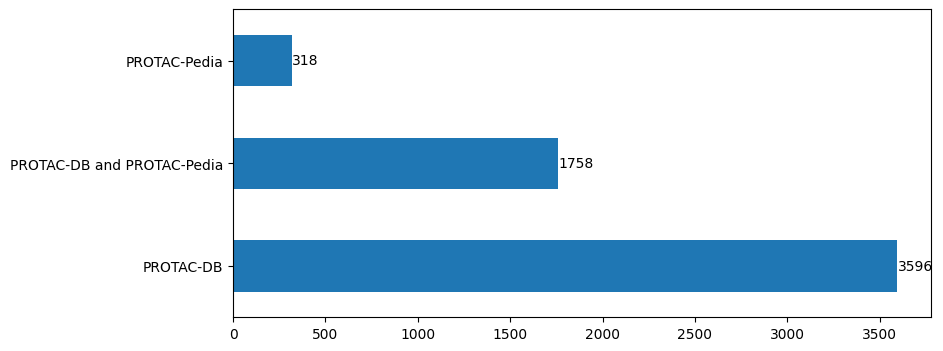

In [25]:
# Plot the distribution of the Database column
from matplotlib import pyplot as plt

# Set the figure size of the plot
plt.figure(figsize=(9, 4))
ax = curated_df['Database'].value_counts().plot(kind='barh')
plt.ylabel('')
# Add the count on the bars
for i, v in enumerate(curated_df['Database'].value_counts()):
    plt.text(v + 3, i, str(v), va='center')
plt.show()

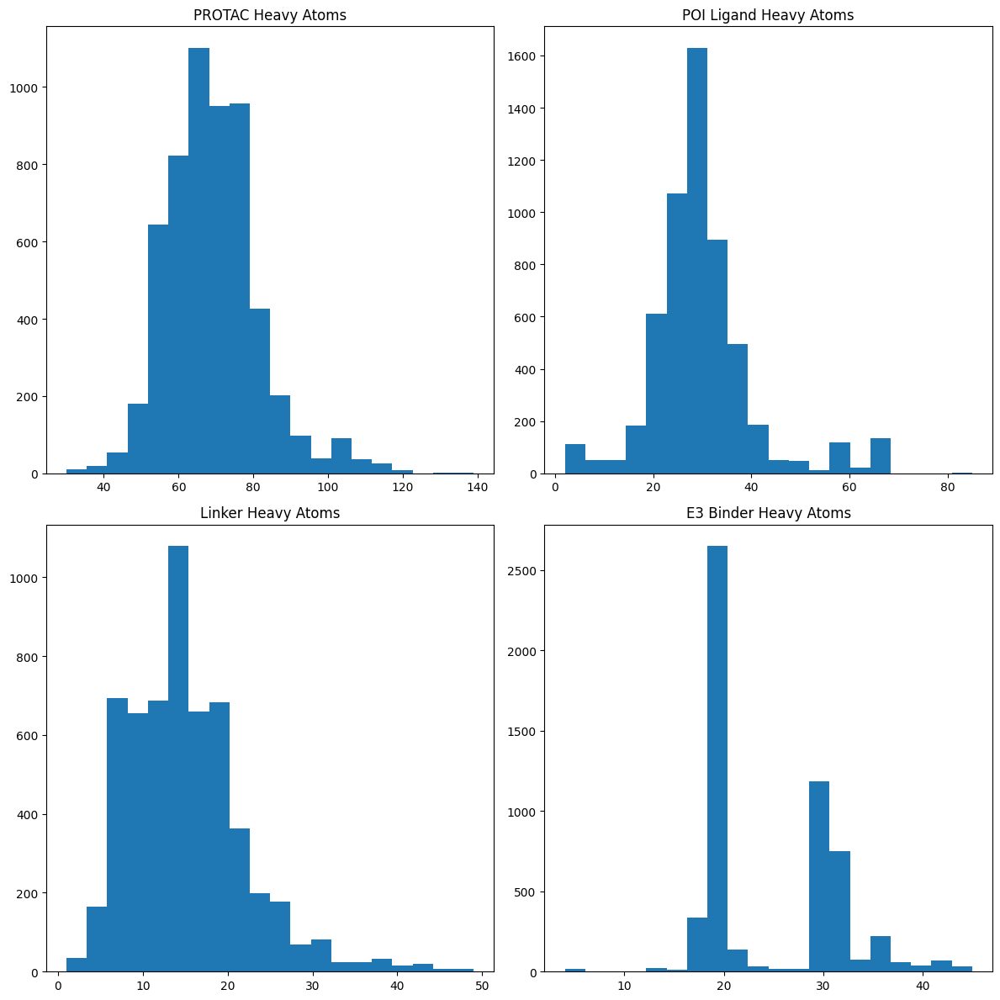

In [26]:
# Plot the distribution of heavy atoms for PROTAC, POI, Linker, and E3 Binder
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

for i, (col, ax) in enumerate(zip(['PROTAC Heavy Atoms', 'POI Ligand Heavy Atoms', 'Linker Heavy Atoms', 'E3 Binder Heavy Atoms'], axes)):
    # tmp = curated_df.drop_duplicates(subset=col.replace('Heavy Atoms', 'ID'))[col].dropna()
    ax.hist(curated_df[col], bins=20)
    ax.set_title(col)
    ax.set_xlabel('')
    ax.set_ylabel('')

plt.tight_layout()
plt.show()

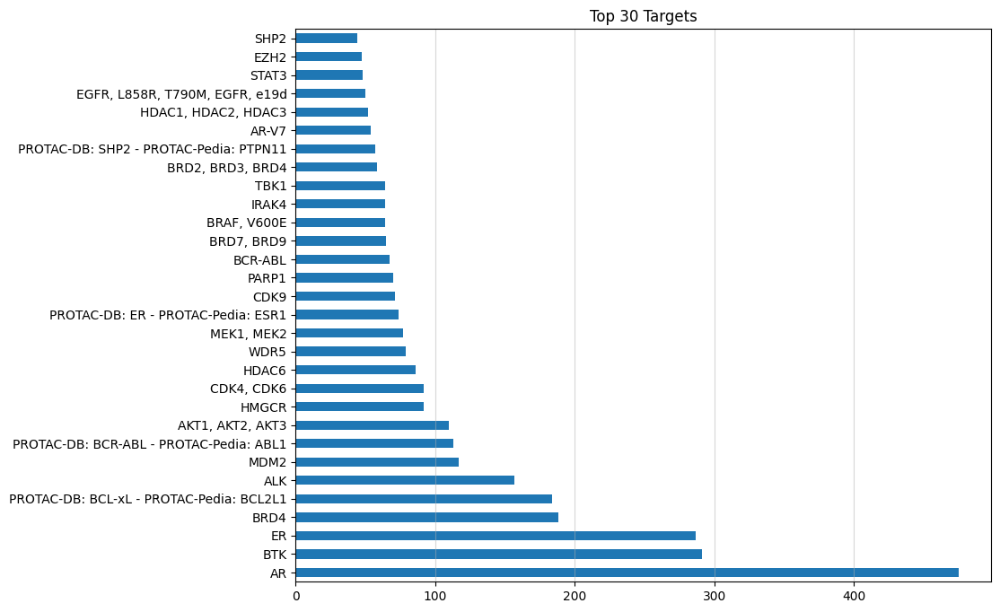

In [27]:
# Plot the Target distribution of the top 20 as an horizontal bar plot
plt.figure(figsize=(10, 8))
top_n = 30
curated_df['Target'].value_counts().sort_values(ascending=False).head(top_n).plot(kind='barh')
plt.xlabel('')
plt.ylabel('')
plt.title(f'Top {top_n} Targets')
plt.grid(axis='x', alpha=0.5)
plt.show()

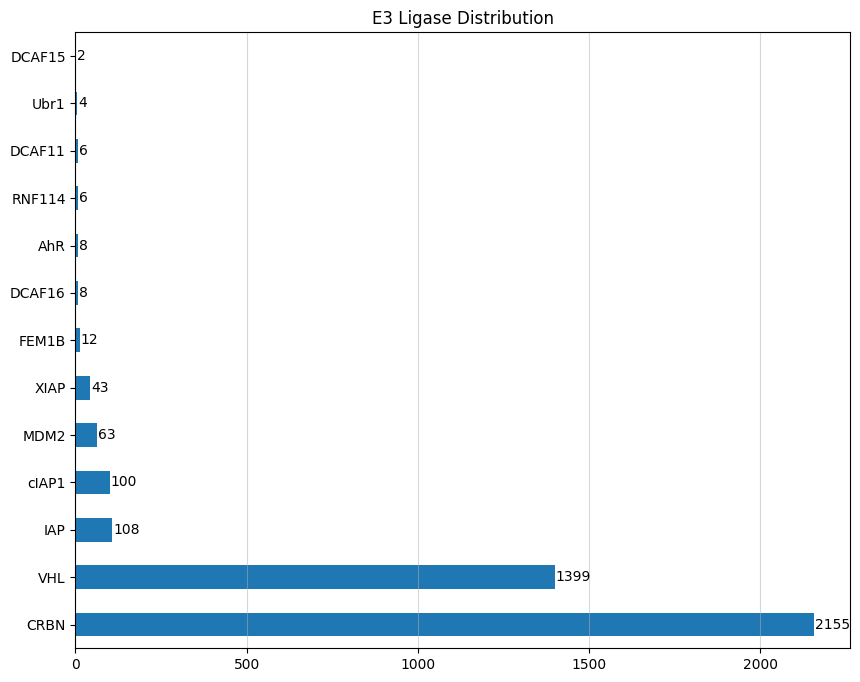

In [28]:
# Plot the E3 Ligase distribution as an horizontal bar plot
plt.figure(figsize=(10, 8))
curated_df['E3 Ligase'].value_counts().plot(kind='barh')
plt.xlabel('')
plt.ylabel('')
plt.title('E3 Ligase Distribution')
plt.grid(axis='x', alpha=0.5)
# Plot the count on the bars
for i, v in enumerate(curated_df['E3 Ligase'].value_counts()):
    plt.text(v + 3, i, str(v), va='center')
plt.show()

In [29]:
# Count the average number of unique "Target" associated to the "POI Ligand SMILES" column
print(curated_df.groupby('POI Ligand SMILES with direction')['Number of Targets'].nunique().mean())
print(curated_df.groupby('POI Ligand SMILES with direction')['Target'].nunique())
print('-' * 80)

# Isolate the ones with multiple targets
multiple_targets = curated_df.groupby('POI Ligand SMILES with direction')['Target'].nunique()
multiple_targets = multiple_targets[multiple_targets > 1]
print(multiple_targets)

print('-' * 80)
print(curated_df.groupby('POI Ligand SMILES with direction')['Number of Targets'].mean())
print(curated_df.groupby('POI Ligand SMILES with direction')['Number of Targets'].mean().mean())

1.1885714285714286
POI Ligand SMILES with direction
C/C(=C\C(=O)N[C@H]1CN([*:1])CC[C@H]2CC[C@@H](C(=O)N[C@@H](CCC(N)=O)C(=O)NC(c3ccccc3)c3ccccc3)N2C1=O)c1ccc(C(F)(F)P(=O)(O)O)cc1    1
C/C(=N\Nc1nc(-c2ccc(-c3ccccc3)cc2)cs1)C(=O)[*:1]                                                                                  1
C/C(=N\Nc1nc(-c2ccc(Cl)c(Cl)c2)c(CC(=O)[*:1])s1)C(=O)OCOC(=O)C(C)(C)C                                                             1
C=C(C)c1ccc(OC(C)C)c(-c2cn(C)c(=O)c3[nH]c(C(=O)[*:1])cc23)c1                                                                      1
C=C(C)c1ccc(Oc2ccccc2)c(-c2cn(C)c(=O)c3[nH]c(C(=O)[*:1])cc23)c1                                                                   1
                                                                                                                                 ..
c1cc2[nH]c3cc([*:1])ccc3c2cn1                                                                                                     1
c1ccc(Nc2nc3cnc(Nc4ccc(N

## Load Generated Dataset

In [30]:
generated_df = pd.read_csv(os.path.join(data_dir, 'processed', 'generated_protacs.csv')).reset_index(drop=True)
leftovers_df = pd.read_csv(os.path.join(data_dir, 'processed', 'generated_protacs_leftovers.csv')).reset_index(drop=True)
generated_df = pd.concat([generated_df, leftovers_df], ignore_index=True).drop_duplicates().reset_index(drop=True)

In [31]:
# Get a molecule column in the curated dataframe for PROTAC, POI, Linker, and E3 Binder
def get_number_of_heavy_atoms(smiles: str) -> int:
    """
    Get the number of heavy atoms for a given SMILES string.
    
    Args:
        smiles (str): The input SMILES string.
    
    Returns:
        int: The number of heavy atoms.
    """
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        return None
    return mol.GetNumHeavyAtoms()

def map_number_of_heavy_atoms(row):
    # Check the curated dataframe first
    row['PROTAC Heavy Atoms'] = get_number_of_heavy_atoms(row['PROTAC SMILES'])
    for ligand in ['POI Ligand', 'Linker', 'E3 Binder']:
        row[f'{ligand} Heavy Atoms'] = curated_df[curated_df[f'{ligand} SMILES with direction'] == row[f'{ligand} SMILES with direction']][f'{ligand} Heavy Atoms'].values[0]
    return row


# Get the number of heavy atoms for each molecule
tqdm.pandas(desc='Getting number of heavy atoms')
generated_df = generated_df.progress_apply(map_number_of_heavy_atoms, axis=1)

Getting number of heavy atoms: 100%|██████████| 1214891/1214891 [1:14:36<00:00, 271.37it/s] 


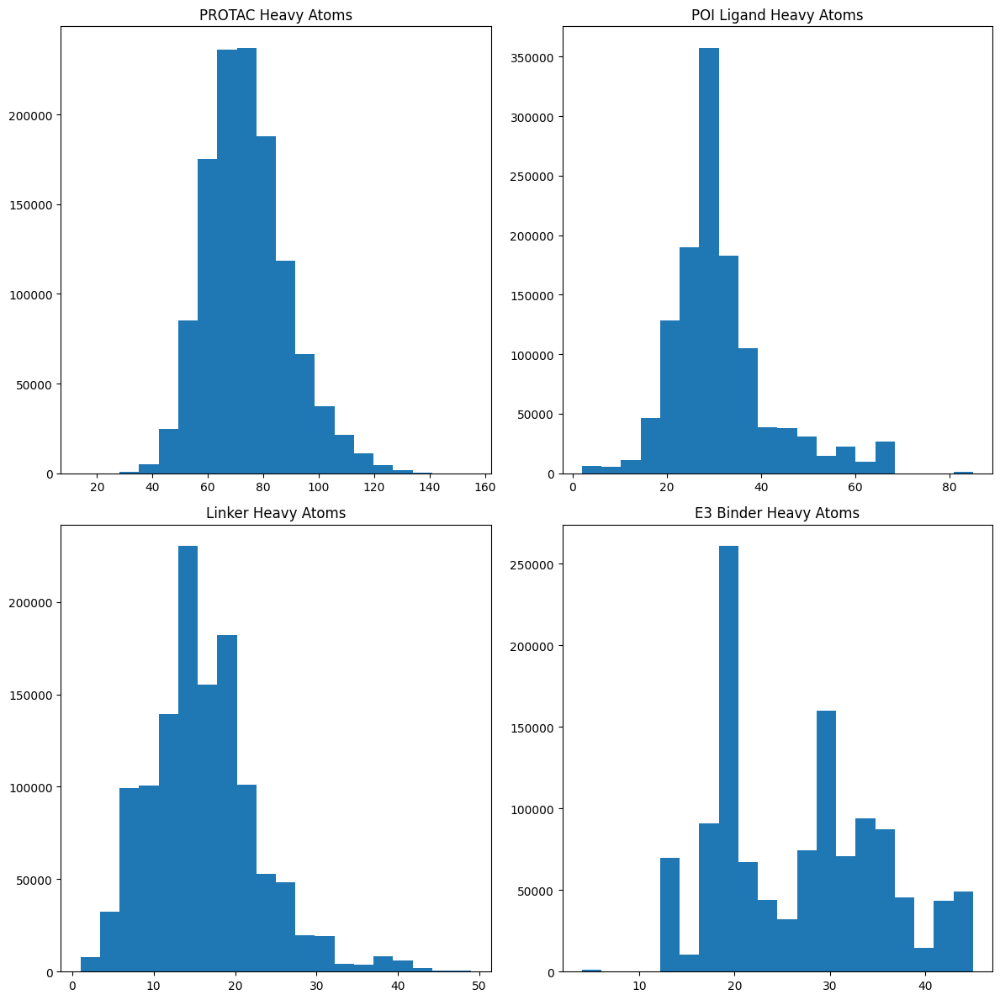

In [32]:
# Plot the distribution of heavy atoms for PROTAC, POI, Linker, and E3 Binder
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

for i, (col, ax) in enumerate(zip(['PROTAC Heavy Atoms', 'POI Ligand Heavy Atoms', 'Linker Heavy Atoms', 'E3 Binder Heavy Atoms'], axes)):
    ax.hist(generated_df[col], bins=20)
    ax.set_title(col)
    ax.set_xlabel('')
    ax.set_ylabel('')

plt.tight_layout()
plt.show()

---

In [234]:
def parse_notes(notes: str) -> Dict[str, Any]:
    # Define the regex pattern to match key-value pairs within parentheses
    pattern = r'\(([^=]+)=([^\)]+)\)'
    
    # Find all matches in the string
    matches = re.findall(pattern, notes)
    
    # Initialize an empty dictionary to store the parsed key-value pairs
    parsed_dict = {}
    
    # Iterate over the matches and add them to the dictionary
    for key, value in matches:
        # Convert the value to the appropriate type (int, bool, None, or str)
        if value.isdigit():
            parsed_dict[key] = int(value)
        elif value.lower() == 'true':
            parsed_dict[key] = True
        elif value.lower() == 'false':
            parsed_dict[key] = False
        elif value.lower() == 'none':
            parsed_dict[key] = float('nan')
        else:
            parsed_dict[key] = value
    
    return parsed_dict

def add_notes_as_cols(row):
    # Parse the notes column
    notes = parse_notes(row['Notes'])
    
    # Add the parsed notes to the row
    for key, value in notes.items():
        row[key] = value
    
    return row

# Add notes to the curated dataframe
tqdm.pandas(desc='Adding notes as columns')
curated_df = curated_df.progress_apply(add_notes_as_cols, axis=1)
curated_df.columns

Adding notes as columns:   0%|          | 0/5679 [00:00<?, ?it/s]

Adding notes as columns: 100%|██████████| 5679/5679 [00:22<00:00, 249.35it/s]


Index(['Database', 'E3 Binder Functional Group', 'E3 Binder Heavy Atoms',
       'E3 Binder ID', 'E3 Binder Molecule', 'E3 Binder SMILES',
       'E3 Binder SMILES with direction', 'E3 Ligase', 'Linker Heavy Atoms',
       'Linker ID', 'Linker Molecule', 'Linker SMILES',
       'Linker SMILES with direction', 'Notes', 'Number of Targets',
       'POI Ligand Functional Group', 'POI Ligand Heavy Atoms',
       'POI Ligand ID', 'POI Ligand Molecule', 'POI Ligand SMILES',
       'POI Ligand SMILES with direction', 'PROTAC Heavy Atoms', 'PROTAC ID',
       'PROTAC Molecule', 'PROTAC SMILES', 'Target', 'amide_bonds_fixed',
       'attachment_points_swapped_in_linker', 'ester_bonds_fixed',
       'manually_mapped', 'map_with_substr_and_linker_matching', 'matching_e3',
       'matching_linker', 'matching_poi', 'max_iter_on_linkers',
       'morgan_fp_size', 'morgan_radius', 'non_perfect_e3_match',
       'non_perfect_poi_match', 'step'],
      dtype='object')

In [235]:
print(curated_df['matching_linker'].unique())

[nan True]


In [239]:
# Get the number of samples with "step" up to 4
print(f'Number of samples with "step" up to 4: {len(curated_df[curated_df["step"] <= 4]):5,d}')
print(f'{curated_df[curated_df["step"] <= 4].groupby("step").size()}')

Number of samples with "step" up to 4: 4,341
step
0.0    2911
1.0     295
2.0      29
4.0    1106
dtype: int64


In [181]:
# Fillna manually_mapped with False
curated_df['manually_mapped'] = curated_df['manually_mapped'].astype(bool).fillna(False).copy()
tmp = curated_df[~curated_df['manually_mapped']]
# Set the "amide_bonds_fixed" and "ester_bonds_fixed" to False if they are not present
tmp['amide_bonds_fixed'] = tmp['amide_bonds_fixed'].astype(bool).fillna(False)
tmp['ester_bonds_fixed'] = tmp['ester_bonds_fixed'].astype(bool).fillna(False)

safe_display(tmp["matching_linker"].value_counts())

# Get the some statistics (as percetages) of the "amide_bonds_fixed", "ester_bonds_fixed", "matching_linker", "matching_poi", "matching_e3", columns.
# Put them into a single dataframe to display.
stats_df = pd.DataFrame({
    'amide_bonds_fixed': [
        tmp['amide_bonds_fixed'].sum(),
        tmp['amide_bonds_fixed'].fillna(False).mean(),
    ],
    'ester_bonds_fixed': [
        tmp['ester_bonds_fixed'].sum(),
        tmp['ester_bonds_fixed'].fillna(False).mean(),
    ],
    'map_with_poi_and_e3': [
        tmp[tmp['matching_poi'] & tmp['matching_e3'] & (tmp['matching_linker'].isna())].shape[0],
        tmp[tmp['matching_poi'] & tmp['matching_e3'] & (tmp['matching_linker'].isna())].shape[0] / tmp.shape[0],
    ],
    'map_with_substr_and_linker_matching': [
        tmp['map_with_substr_and_linker_matching'].sum(),
        tmp['map_with_substr_and_linker_matching'].fillna(False).mean(),
    ],
    'map_with_linker_only': [
        tmp[(~tmp['matching_poi']) & (~tmp['matching_e3']) & (tmp['matching_linker'].notna())].shape[0],
        tmp[(~tmp['matching_poi']) & (~tmp['matching_e3']) & (tmp['matching_linker'].notna())].shape[0] / tmp.shape[0],
    ],
    'attachment_points_swapped_in_linker': [
        tmp['attachment_points_swapped_in_linker'].sum(),
        tmp['attachment_points_swapped_in_linker'].fillna(False).mean(),
    ],
    'matching_poi': [
        tmp['matching_poi'].sum(),
        tmp['matching_poi'].fillna(False).mean(),
    ],
    'matching_e3': [
        tmp['matching_e3'].sum(),
        tmp['matching_e3'].fillna(False).mean(),
    ],
}, index=['Count', 'Percentage'])
safe_display(stats_df.round(3))

/var/folders/jd/c3ktk08x3cj7ck0516xnxrvm0000gn/T/ipykernel_53037/2564839945.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp['amide_bonds_fixed'] = tmp['amide_bonds_fixed'].astype(bool).fillna(False)
/var/folders/jd/c3ktk08x3cj7ck0516xnxrvm0000gn/T/ipykernel_53037/2564839945.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp['ester_bonds_fixed'] = tmp['ester_bonds_fixed'].astype(bool).fillna(False)


matching_linker
True    1349
Name: count, dtype: int64

/var/folders/jd/c3ktk08x3cj7ck0516xnxrvm0000gn/T/ipykernel_53037/2564839945.py:27: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  tmp['map_with_substr_and_linker_matching'].fillna(False).mean(),
/var/folders/jd/c3ktk08x3cj7ck0516xnxrvm0000gn/T/ipykernel_53037/2564839945.py:35: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  tmp['attachment_points_swapped_in_linker'].fillna(False).mean(),
/var/folders/jd/c3ktk08x3cj7ck0516xnxrvm0000gn/T/ipykernel_53037/2564839945.py:39: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated a

,amide_bonds_fixed,ester_bonds_fixed,map_with_poi_and_e3,map_with_substr_and_linker_matching,map_with_linker_only,attachment_points_swapped_in_linker,matching_poi,matching_e3
Count,1859.000,458.000,4311.000,1349.000,1349.000,151.000,4396.000,5446.000
Percentage,0.328,0.081,0.762,0.238,0.238,0.027,0.777,0.962


Checking if E3 binder is similar to POI: 100%|██████████| 5679/5679 [00:01<00:00, 3728.49it/s]


Number of entries where the E3 binder is similar to the POI ligand:    41
--------------------------------------------------------------------------------
ID: 437a3a0e3111aebc27db2768c2cd01abcaf884295b8e870dcfab08cf5975b19d
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](NC(=O)COCCOCCOCCOCCOCCOc2cc(-c3scnc3C)ccc2CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)C2(C#N)CC2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCCO[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)C2(C#N)CC2)C(C)(C)C)c([*:2])c1


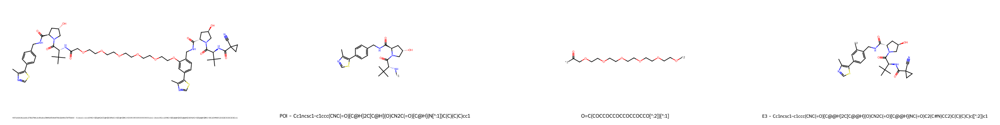

ID: 38f127327704498b6071b6e67be35b3f3ad159c1bcf745866918f05b99fa83bb
PROTAC: O=C1CCC(N2C(=O)c3cccc(NCCOCCOCCNc4cccc5c4C(=O)N(C4CCC(=O)NC4=O)C5=O)c3C2=O)C(=O)N1
POI: O=C1CCC(N2C(=O)c3cccc([*:1])c3C2=O)C(=O)N1
Linker: C(COCCOCCN[*:2])N[*:1]
E3: O=C1CCC(N2C(=O)c3cccc([*:2])c3C2=O)C(=O)N1


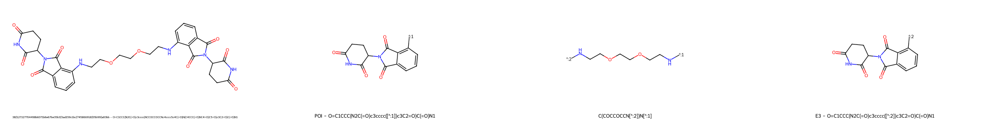

ID: 89a84ce0ac4d81c697f09024367d22cc49457b22a806071387e3013a15a7bcde
PROTAC: O=C1CCC(N2C(=O)c3cccc(NCCCOCCOCCCNc4cccc5c4C(=O)N(C4CCC(=O)NC4=O)C5=O)c3C2=O)C(=O)N1
POI: O=C1CCC(N2C(=O)c3cccc(N[*:1])c3C2=O)C(=O)N1
Linker: C(COCCOCCC[*:2])C[*:1]
E3: O=C1CCC(N2C(=O)c3cccc(N[*:2])c3C2=O)C(=O)N1


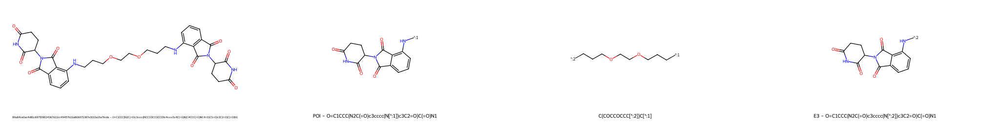

ID: 6b012bcfe183a268441d2fe46ffbd52b46775d1313088c23f565447a4e19241b
PROTAC: O=C1CCC(N2C(=O)c3cccc(NCCCOCCCCOCCCNc4cccc5c4C(=O)N(C4CCC(=O)NC4=O)C5=O)c3C2=O)C(=O)N1
POI: O=C1CCC(N2C(=O)c3cccc([*:1])c3C2=O)C(=O)N1
Linker: C(CCOCCCN[*:2])COCCCN[*:1]
E3: O=C1CCC(N2C(=O)c3cccc([*:2])c3C2=O)C(=O)N1


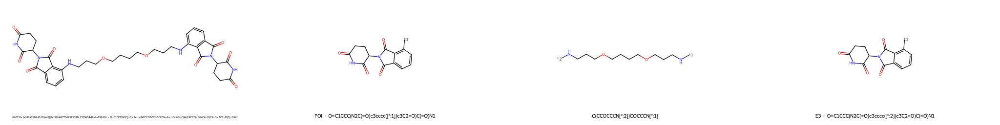

ID: 6a31d800731df6685400d55b78f202d88260c70fe7f6ccaab2f7ec19a812f288
PROTAC: O=C1CCC(N2C(=O)c3cccc(NCCCOCCOCCOCCCNc4cccc5c4C(=O)N(C4CCC(=O)NC4=O)C5=O)c3C2=O)C(=O)N1
POI: O=C1CCC(N2C(=O)c3cccc([*:1])c3C2=O)C(=O)N1
Linker: C(CN[*:1])COCCOCCOCCCN[*:2]
E3: O=C1CCC(N2C(=O)c3cccc([*:2])c3C2=O)C(=O)N1


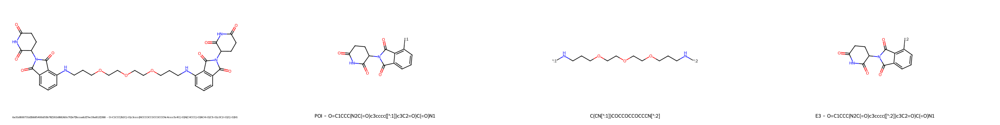

ID: eed52386c21ac2d67a555ab7b3c2170cded6e8cdb2db298b9c1b00e53c7cad2d
PROTAC: O=C1CCC(N2C(=O)c3cccc(NCCOCCNc4cccc5c4C(=O)N(C4CCC(=O)NC4=O)C5=O)c3C2=O)C(=O)N1
POI: O=C1CCC(N2C(=O)c3cccc([*:1])c3C2=O)C(=O)N1
Linker: C(COCCN[*:2])N[*:1]
E3: O=C1CCC(N2C(=O)c3cccc([*:2])c3C2=O)C(=O)N1


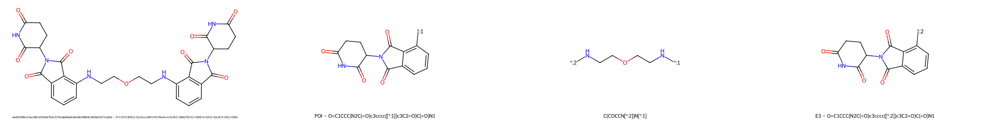

ID: fda19495da35f2a877ffb1ee7e04ffac622f3dedd8a0f351dc019960844a9668
PROTAC: O=C1CCC(N2C(=O)c3cccc(OCCOCCOCCOc4cccc5c4C(=O)N(C4CCC(=O)NC4=O)C5=O)c3C2=O)C(=O)N1
POI: O=C1CCC(N2C(=O)c3cccc([*:1])c3C2=O)C(=O)N1
Linker: C(COCCO[*:2])OCCO[*:1]
E3: O=C1CCC(N2C(=O)c3cccc([*:2])c3C2=O)C(=O)N1


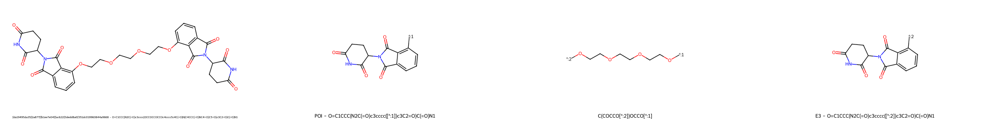

ID: 245a615987de5d59481f18347d12690ec905c74a9d049c8a3ec8367ce66986de
PROTAC: O=C1CCC(N2C(=O)c3ccc(C(=O)NCCOCCOCCNC(=O)c4ccc5c(c4)C(=O)N(C4CCC(=O)NC4=O)C5=O)cc3C2=O)C(=O)N1
POI: O=C1CCC(N2C(=O)c3ccc(C(=O)[*:1])cc3C2=O)C(=O)N1
Linker: O=C(NCCOCCOCCN[*:1])[*:2]
E3: O=C1CCC(N2C(=O)c3ccc([*:2])cc3C2=O)C(=O)N1


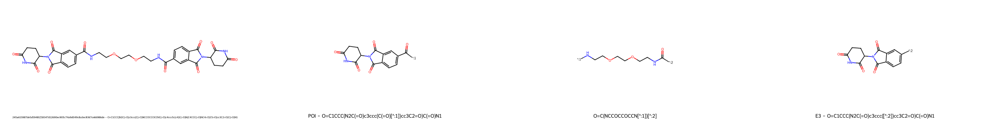

ID: aa2fa146324b6f0b8b10edc4ed57ec15ba2f76c70e77081cb7a448ef9f4af37e
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](NC(=O)COCCOCCOCCOCC(=O)N[C@H](C(=O)N2C[C@H](O)C[C@H]2C(=O)NCc2ccc(-c3scnc3C)cc2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCC(=O)[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:2])C(C)(C)C)cc1


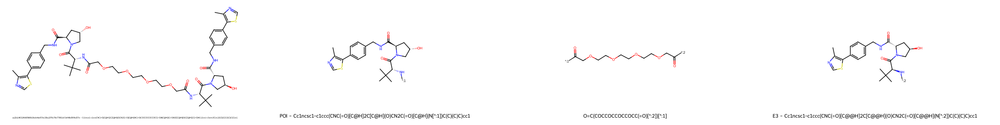

ID: 88386d33dc775e3e2ca8508fab92f396de45b01fbc06d284a858190d87f2754c
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](NC(=O)COCCOCCOCCOCCOCC(=O)N[C@H](C(=O)N2C[C@H](O)C[C@H]2C(=O)NCc2ccc(-c3scnc3C)cc2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCC(=O)[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:2])C(C)(C)C)cc1


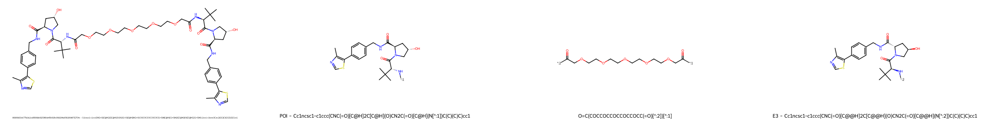

ID: 13000a802c12fe60f35e884776fe666427bfa7eced52dcba13a40fb3dc3c7a53
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](NC(=O)COCCOCCOCCOCCOCCOCC(=O)N[C@H](C(=O)N2C[C@H](O)C[C@H]2C(=O)NCc2ccc(-c3scnc3C)cc2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCCOCC(=O)[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:2])C(C)(C)C)cc1


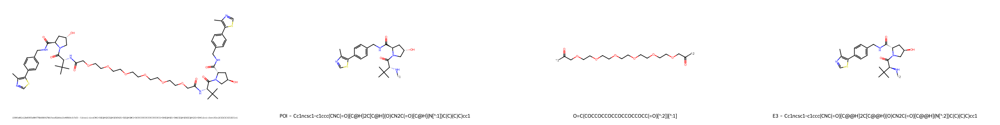

ID: ebce6e83077a593e3914e5e45340ce5c013ccb2ce8fb464f320b6d44c917675b
PROTAC: CC(=O)N[C@H](C(=O)N1C[C@H](O)C[C@H]1C(=O)NCc1ccc(-c2scnc2C)cc1OCCOCCOCCOCCOCCOc1cc(-c2scnc2C)ccc1CNC(=O)[C@H]1C[C@H](O)CN1C(=O)[C@H](NC(C)=O)C(C)(C)C)C(C)(C)C
POI: CC(=O)N[C@H](C(=O)N1C[C@H](O)C[C@H]1C(=O)NCc1ccc(-c2scnc2C)cc1[*:1])C(C)(C)C
Linker: C(COCCOCCO[*:2])OCCOCCO[*:1]
E3: CC(=O)N[C@@H](C(=O)N1C[C@@H](O)C[C@@H]1C(=O)NCc1ccc(-c2scnc2C)cc1[*:2])C(C)(C)C


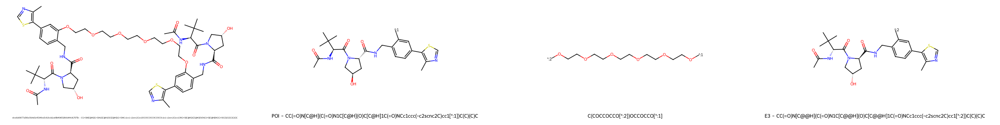

ID: 563976c5575d85cbad2192bc486a7ab48a429ae734cf408b473f8c22fd5889b4
PROTAC: CC(=O)N[C@H](C(=O)N1C[C@H](O)C[C@H]1C(=O)NCc1ccc(-c2scnc2C)cc1OCCOCCOCCOCCOCCOCC(=O)N[C@@H](C(=O)N1C[C@@H](O)C[C@@H]1C(=O)NCc1ccc(-c2scnc2C)cc1)C(C)(C)C)C(C)(C)C
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCCO[*:2])[*:1]
E3: CC(=O)N[C@H](C(=O)N1C[C@H](O)C[C@H]1C(=O)NCc1ccc(-c2scnc2C)cc1[*:2])C(C)(C)C


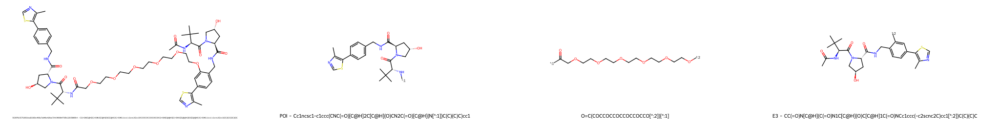

ID: 5069bccfdc3bd359eeabe7e123b01fa42db4c00c514a6de591675c774365d381
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](NC(=O)C2(C#N)CC2)C(C)(C)C)c(OCCOCCOCCOCCOCCOc2cc(-c3scnc3C)ccc2CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)C2(C#N)CC2)C(C)(C)C)c1
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@H]2C[C@H](O)CN2C(=O)[C@H](NC(=O)C2(C#N)CC2)C(C)(C)C)c([*:1])c1
Linker: C(COCCOCCO[*:2])OCCOCCO[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)C2(C#N)CC2)C(C)(C)C)c([*:2])c1


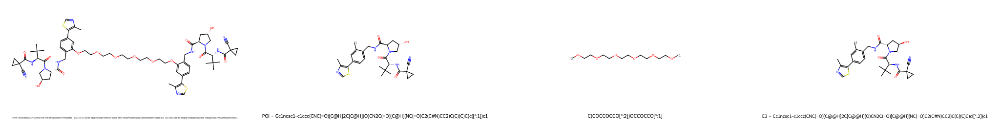

ID: aa2fa146324b6f0b8b10edc4ed57ec15ba2f76c70e77081cb7a448ef9f4af37e
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)COCCOCCOCCOCC(=O)N[C@H](C(=O)N2C[C@H](O)C[C@H]2C(=O)NCc2ccc(-c3scnc3C)cc2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCC(=O)[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:2])C(C)(C)C)cc1


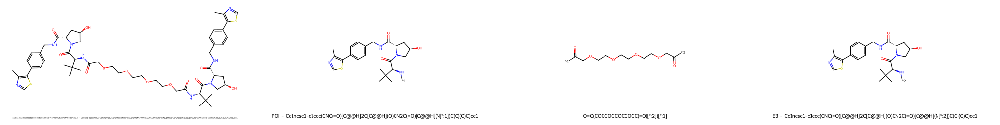

ID: 88386d33dc775e3e2ca8508fab92f396de45b01fbc06d284a858190d87f2754c
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)COCCOCCOCCOCCOCC(=O)N[C@H](C(=O)N2C[C@H](O)C[C@H]2C(=O)NCc2ccc(-c3scnc3C)cc2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCC(=O)[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:2])C(C)(C)C)cc1


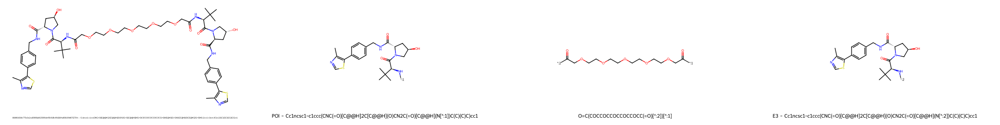

ID: 13000a802c12fe60f35e884776fe666427bfa7eced52dcba13a40fb3dc3c7a53
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)COCCOCCOCCOCCOCCOCC(=O)N[C@H](C(=O)N2C[C@H](O)C[C@H]2C(=O)NCc2ccc(-c3scnc3C)cc2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCCOCC(=O)[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:2])C(C)(C)C)cc1


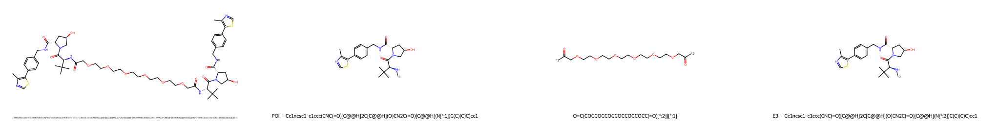

ID: ebce6e83077a593e3914e5e45340ce5c013ccb2ce8fb464f320b6d44c917675b
PROTAC: CC(=O)N[C@H](C(=O)N1C[C@H](O)C[C@H]1C(=O)NCc1ccc(-c2scnc2C)cc1OCCOCCOCCOCCOCCOc1cc(-c2scnc2C)ccc1CNC(=O)[C@@H]1C[C@@H](O)CN1C(=O)[C@@H](NC(C)=O)C(C)(C)C)C(C)(C)C
POI: CC(=O)N[C@H](C(=O)N1C[C@H](O)C[C@H]1C(=O)NCc1ccc(-c2scnc2C)cc1[*:1])C(C)(C)C
Linker: C(COCCOCCO[*:2])OCCOCCO[*:1]
E3: CC(=O)N[C@H](C(=O)N1C[C@H](O)C[C@H]1C(=O)NCc1ccc(-c2scnc2C)cc1[*:2])C(C)(C)C


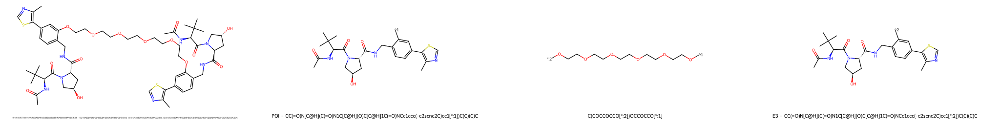

ID: 5069bccfdc3bd359eeabe7e123b01fa42db4c00c514a6de591675c774365d381
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)C2(C#N)CC2)C(C)(C)C)c(OCCOCCOCCOCCOCCOc2cc(-c3scnc3C)ccc2CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)C2(C#N)CC2)C(C)(C)C)c1
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)C2(C#N)CC2)C(C)(C)C)c([*:1])c1
Linker: C(COCCOCCO[*:2])OCCOCCO[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)C2(C#N)CC2)C(C)(C)C)c([*:2])c1


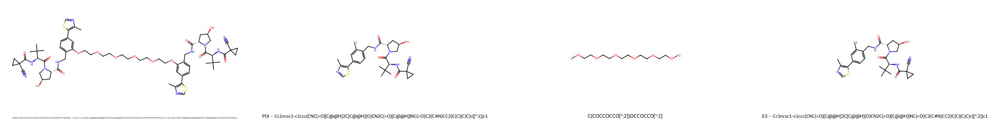

ID: 563976c5575d85cbad2192bc486a7ab48a429ae734cf408b473f8c22fd5889b4
PROTAC: CC(=O)N[C@H](C(=O)N1C[C@H](O)C[C@H]1C(=O)NCc1ccc(-c2scnc2C)cc1OCCOCCOCCOCCOCCOCC(=O)N[C@H](C(=O)N1C[C@H](O)C[C@H]1C(=O)NCc1ccc(-c2scnc2C)cc1)C(C)(C)C)C(C)(C)C
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCCO[*:2])[*:1]
E3: CC(=O)N[C@H](C(=O)N1C[C@H](O)C[C@H]1C(=O)NCc1ccc(-c2scnc2C)cc1[*:2])C(C)(C)C


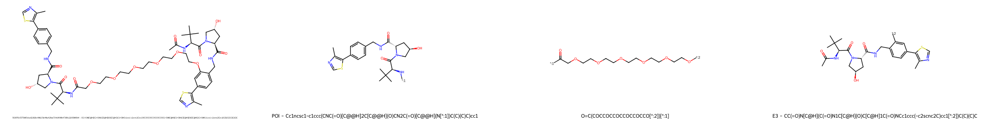

ID: 437a3a0e3111aebc27db2768c2cd01abcaf884295b8e870dcfab08cf5975b19d
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)COCCOCCOCCOCCOCCOc2cc(-c3scnc3C)ccc2CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)C2(C#N)CC2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCCO[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)[C@@H]2C[C@@H](O)CN2C(=O)[C@@H](NC(=O)C2(C#N)CC2)C(C)(C)C)c([*:2])c1


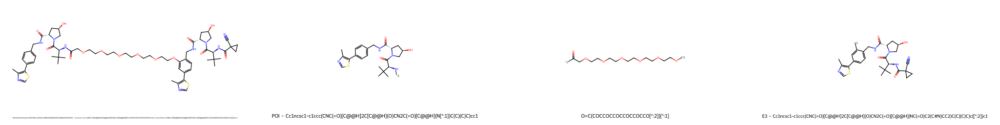

ID: 376a4aab04eceb2cba774509c6fcd9e5295ae7f9e723fa7feb176ac77d57a5ab
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(CCCCCCCCCN2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=NC(c4ccc(Cl)cc4)C3c3ccc(Cl)cc3)CC2)CC1
POI: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)[*:1]
Linker: C(CCN1CCN([*:1])CC1)CC[*:2]
E3: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(CCCC[*:2])CC1


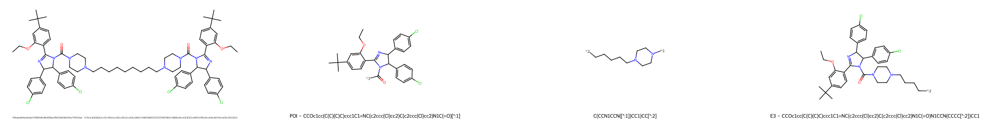

ID: 7c7eb93420b3bf8aba5712ce0def7b460295df96f227015f8c2cb682394742b5
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(C(=O)CCCCCC(=O)N2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=NC(c4ccc(Cl)cc4)C3c3ccc(Cl)cc3)CC2)CC1
POI: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:1])CC1
Linker: O=C(CCCCCC(=O)[*:2])[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])CC1


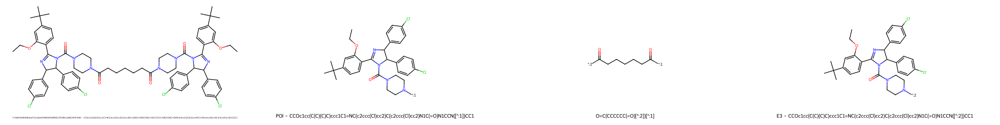

ID: 9415b5862f804d6efa3e3ffdacbbf4b15d8a6aa07fddc32f28154176658a79ef
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(C(=O)CCCCCCCC(=O)N2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=NC(c4ccc(Cl)cc4)C3c3ccc(Cl)cc3)CC2)CC1
POI: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:1])CC1
Linker: O=C(CCCCCCCC(=O)[*:2])[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])CC1


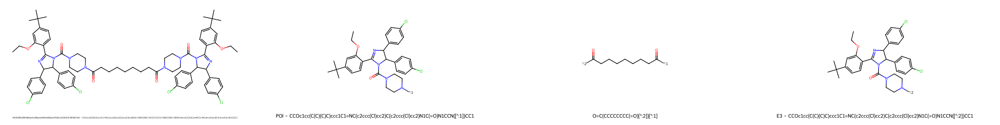

ID: 9b8867ae49b6e3e0ccd0e7cc2246fbb53ee0eee01db0f092e19e5117eb3c1c45
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(C(=O)CCCCCCCCCC(=O)N2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=NC(c4ccc(Cl)cc4)C3c3ccc(Cl)cc3)CC2)CC1
POI: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:1])CC1
Linker: O=C(CCCCCCCCCC(=O)[*:2])[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])CC1


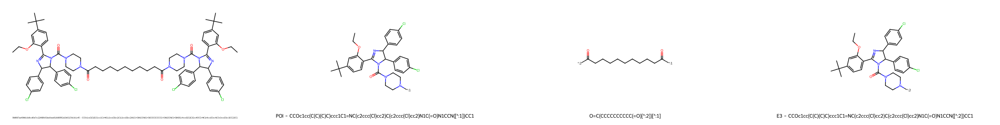

ID: 4f3fa787ec8b5ad6b71fc4ca5aaee6ec4ad08d11757aa0455fd577fbd4fcd460
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(C(=O)CCCCCCCCCCCCCCC(=O)N2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=NC(c4ccc(Cl)cc4)C3c3ccc(Cl)cc3)CC2)CC1
POI: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:1])CC1
Linker: O=C(CCCCCCCCCCCCCCC(=O)[*:2])[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])CC1


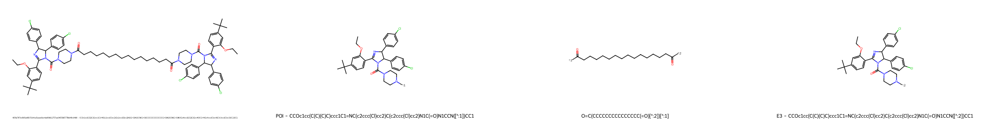

ID: fcb85d3440b38cb82a477aa933c78ea2d6973234f81203c990085cf4eb6b73f8
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(C(=O)COCCOCC(=O)N2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=NC(c4ccc(Cl)cc4)C3c3ccc(Cl)cc3)CC2)CC1
POI: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:1])CC1
Linker: O=C(COCCOCC(=O)[*:2])[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])CC1


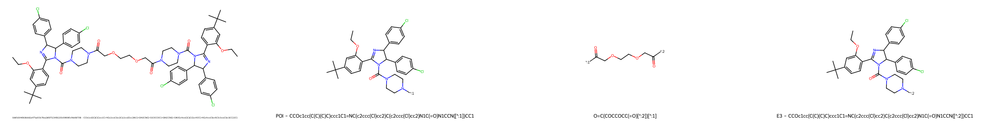

ID: bd827447db93284abf794301fff142074ad25a292e8e875b898a6f90487148fc
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(C(=O)COCCOCCOCC(=O)N2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=NC(c4ccc(Cl)cc4)C3c3ccc(Cl)cc3)CC2)CC1
POI: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:1])CC1
Linker: O=C(COCCOCCOCC(=O)[*:2])[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])CC1


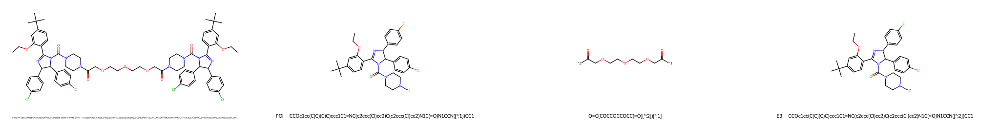

ID: a9e0637fd3e55f57ee31a24dc0092fe3b811e4ba3b8eaa0107d923c8a7abed6e
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)NCCOCCOCCOCCNC(=O)CN2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=NC(c4ccc(Cl)cc4)C3c3ccc(Cl)cc3)CC2=O)C(=O)C1
POI: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)[*:1])C(=O)C1
Linker: O=C(C[*:2])NCCOCCOCCOCCN[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])C(=O)C1


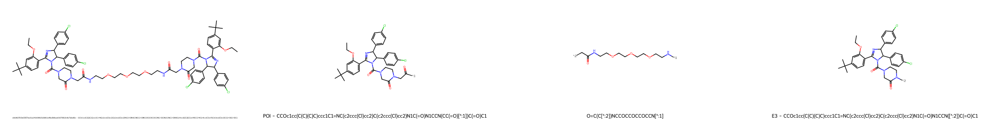

ID: 459d7879248032c36d1ecbc9c745f1000264741b12ea1365c6340f77ca6709cb
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)NCCOCCOCCNC(=O)CN2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=NC(c4ccc(Cl)cc4)C3c3ccc(Cl)cc3)CC2=O)C(=O)C1
POI: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)[*:1])C(=O)C1
Linker: O=C(C[*:2])NCCOCCOCCN[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])C(=O)C1


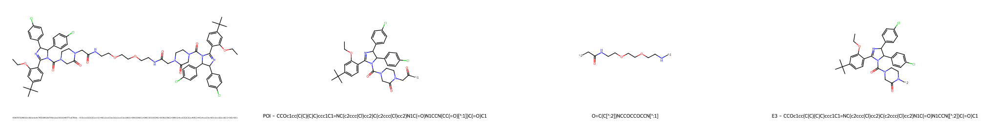

ID: 89ef01d7ffd15b162b27e162d3103a76f1476eda96edd8c94a4ac89ed236b0a0
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)NCCOCCNC(=O)CN2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=NC(c4ccc(Cl)cc4)C3c3ccc(Cl)cc3)CC2=O)C(=O)C1
POI: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)[*:1])C(=O)C1
Linker: O=C(C[*:2])NCCOCCN[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=NC(c2ccc(Cl)cc2)C(c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])C(=O)C1


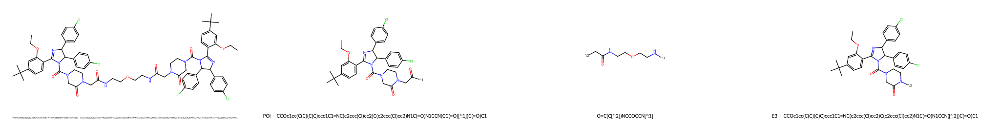

ID: a9e0637fd3e55f57ee31a24dc0092fe3b811e4ba3b8eaa0107d923c8a7abed6e
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=N[C@@H](c2ccc(Cl)cc2)[C@@H](c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)NCCOCCOCCOCCNC(=O)CN2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=N[C@@H](c4ccc(Cl)cc4)[C@H]3c3ccc(Cl)cc3)CC2=O)C(=O)C1
POI: CCOc1cc(C(C)(C)C)ccc1C1=N[C@@H](c2ccc(Cl)cc2)[C@@H](c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)[*:1])C(=O)C1
Linker: O=C(C[*:2])NCCOCCOCCOCCN[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=N[C@@H](c2ccc(Cl)cc2)[C@@H](c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])C(=O)C1


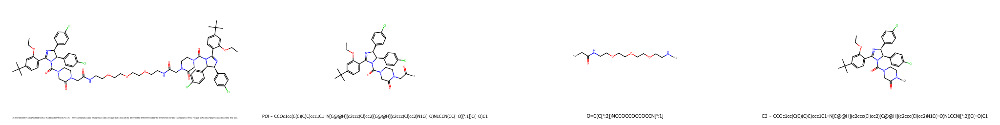

ID: a9e0637fd3e55f57ee31a24dc0092fe3b811e4ba3b8eaa0107d923c8a7abed6e
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=N[C@H](c2ccc(Cl)cc2)[C@H](c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)NCCOCCOCCOCCNC(=O)CN2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=N[C@H](c4ccc(Cl)cc4)[C@@H]3c3ccc(Cl)cc3)CC2=O)C(=O)C1
POI: CCOc1cc(C(C)(C)C)ccc1C1=N[C@H](c2ccc(Cl)cc2)[C@H](c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)[*:1])C(=O)C1
Linker: O=C(C[*:2])NCCOCCOCCOCCN[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=N[C@H](c2ccc(Cl)cc2)[C@H](c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])C(=O)C1


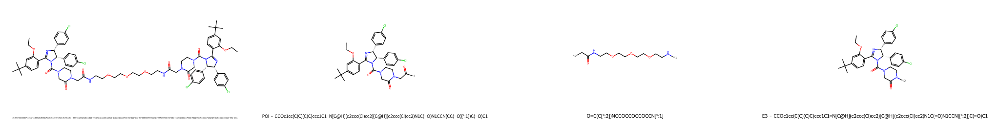

ID: a9e0637fd3e55f57ee31a24dc0092fe3b811e4ba3b8eaa0107d923c8a7abed6e
PROTAC: CCOc1cc(C(C)(C)C)ccc1C1=N[C@@H](c2ccc(Cl)cc2)[C@@H](c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)NCCOCCOCCOCCNC(=O)CN2CCN(C(=O)N3C(c4ccc(C(C)(C)C)cc4OCC)=N[C@H](c4ccc(Cl)cc4)[C@@H]3c3ccc(Cl)cc3)CC2=O)C(=O)C1
POI: CCOc1cc(C(C)(C)C)ccc1C1=N[C@@H](c2ccc(Cl)cc2)[C@@H](c2ccc(Cl)cc2)N1C(=O)N1CCN(CC(=O)[*:1])C(=O)C1
Linker: O=C(C[*:2])NCCOCCOCCOCCN[*:1]
E3: CCOc1cc(C(C)(C)C)ccc1C1=N[C@H](c2ccc(Cl)cc2)[C@H](c2ccc(Cl)cc2)N1C(=O)N1CCN([*:2])C(=O)C1


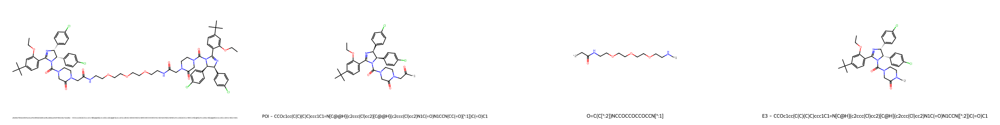

ID: aa2fa146324b6f0b8b10edc4ed57ec15ba2f76c70e77081cb7a448ef9f4af37e
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(NC(=O)COCCOCCOCCOCC(=O)NC(C(=O)N2CC(O)CC2C(=O)NCc2ccc(-c3scnc3C)cc2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCC(=O)[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(N[*:2])C(C)(C)C)cc1


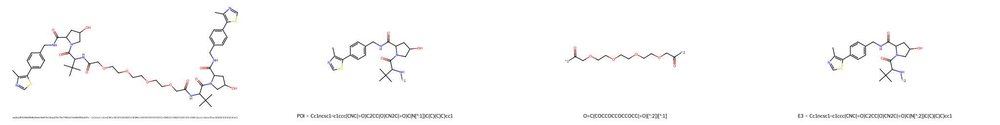

ID: 88386d33dc775e3e2ca8508fab92f396de45b01fbc06d284a858190d87f2754c
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(NC(=O)COCCOCCOCCOCCOCC(=O)NC(C(=O)N2CC(O)CC2C(=O)NCc2ccc(-c3scnc3C)cc2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCC(=O)[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(N[*:2])C(C)(C)C)cc1


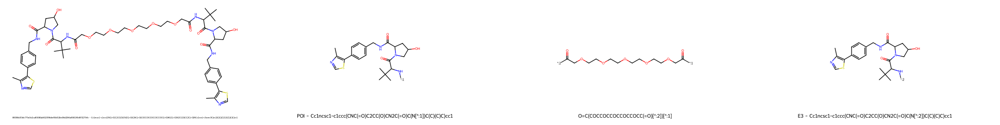

ID: 13000a802c12fe60f35e884776fe666427bfa7eced52dcba13a40fb3dc3c7a53
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(NC(=O)COCCOCCOCCOCCOCCOCC(=O)NC(C(=O)N2CC(O)CC2C(=O)NCc2ccc(-c3scnc3C)cc2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCCOCC(=O)[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(N[*:2])C(C)(C)C)cc1


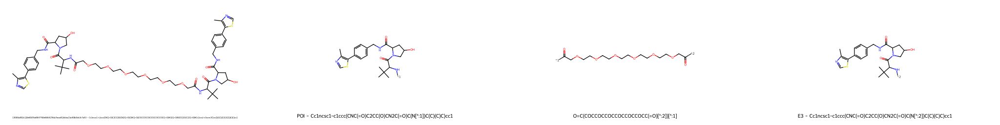

ID: ebce6e83077a593e3914e5e45340ce5c013ccb2ce8fb464f320b6d44c917675b
PROTAC: CC(=O)NC(C(=O)N1CC(O)CC1C(=O)NCc1ccc(-c2scnc2C)cc1OCCOCCOCCOCCOCCOc1cc(-c2scnc2C)ccc1CNC(=O)C1CC(O)CN1C(=O)C(NC(C)=O)C(C)(C)C)C(C)(C)C
POI: CC(=O)NC(C(=O)N1CC(O)CC1C(=O)NCc1ccc(-c2scnc2C)cc1[*:1])C(C)(C)C
Linker: C(COCCOCCO[*:2])OCCOCCO[*:1]
E3: CC(=O)NC(C(=O)N1CC(O)CC1C(=O)NCc1ccc(-c2scnc2C)cc1[*:2])C(C)(C)C


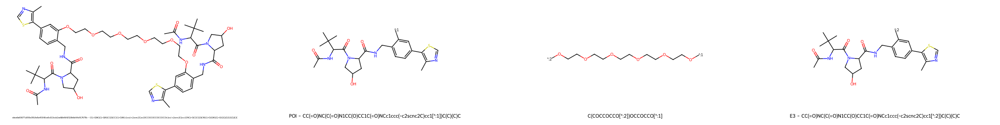

ID: 563976c5575d85cbad2192bc486a7ab48a429ae734cf408b473f8c22fd5889b4
PROTAC: CC(=O)NC(C(=O)N1CC(O)CC1C(=O)NCc1ccc(-c2scnc2C)cc1OCCOCCOCCOCCOCCOCC(=O)NC(C(=O)N1CC(O)CC1C(=O)NCc1ccc(-c2scnc2C)cc1)C(C)(C)C)C(C)(C)C
POI: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCCO[*:2])[*:1]
E3: CC(=O)NC(C(=O)N1CC(O)CC1C(=O)NCc1ccc(-c2scnc2C)cc1[*:2])C(C)(C)C


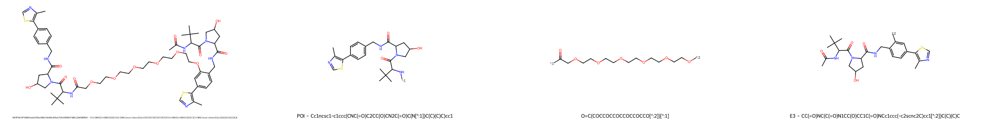

ID: 5069bccfdc3bd359eeabe7e123b01fa42db4c00c514a6de591675c774365d381
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(NC(=O)C2(C#N)CC2)C(C)(C)C)c(OCCOCCOCCOCCOCCOc2cc(-c3scnc3C)ccc2CNC(=O)C2CC(O)CN2C(=O)C(NC(=O)C2(C#N)CC2)C(C)(C)C)c1
POI: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(NC(=O)C2(C#N)CC2)C(C)(C)C)c([*:1])c1
Linker: C(COCCOCCO[*:2])OCCOCCO[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(NC(=O)C2(C#N)CC2)C(C)(C)C)c([*:2])c1


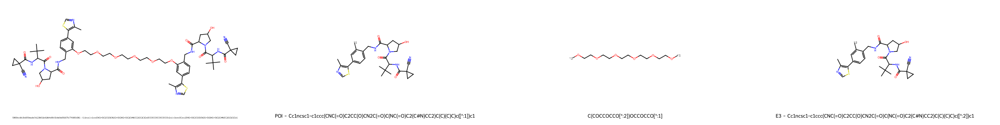

ID: 437a3a0e3111aebc27db2768c2cd01abcaf884295b8e870dcfab08cf5975b19d
PROTAC: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(NC(=O)COCCOCCOCCOCCOCCOc2cc(-c3scnc3C)ccc2CNC(=O)C2CC(O)CN2C(=O)C(NC(=O)C2(C#N)CC2)C(C)(C)C)C(C)(C)C)cc1
POI: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(N[*:1])C(C)(C)C)cc1
Linker: O=C(COCCOCCOCCOCCOCCO[*:2])[*:1]
E3: Cc1ncsc1-c1ccc(CNC(=O)C2CC(O)CN2C(=O)C(NC(=O)C2(C#N)CC2)C(C)(C)C)c([*:2])c1


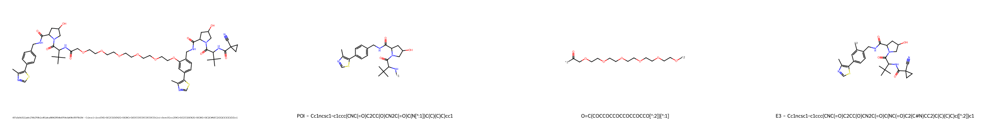

In [269]:
def is_e3_similar_to_poi(row):
    """ Check if the E3 binder is similar to the POI ligand using Tanimoto similarity. """
    if row['E3 Binder SMILES'] is None or row['POI Ligand SMILES'] is None:
        return False
    e3_mol = Chem.MolFromSmiles(row['E3 Binder SMILES'])
    poi_mol = Chem.MolFromSmiles(row['POI Ligand SMILES'])
    if e3_mol is None or poi_mol is None:
        return False
    e3_fp = AllChem.GetMorganFingerprint(e3_mol, 2)
    poi_fp = AllChem.GetMorganFingerprint(poi_mol, 2)
    return DataStructs.TanimotoSimilarity(e3_fp, poi_fp) >= 0.5

# Add a column to `curated_df` that checks if the E3 binder is similar to the POI ligand
tqdm.pandas(desc='Checking if E3 binder is similar to POI')
curated_df['E3 similar to POI'] = curated_df.progress_apply(is_e3_similar_to_poi, axis=1)

# Print the number of entries where the E3 binder is similar to the POI ligand
print(f'Number of entries where the E3 binder is similar to the POI ligand: {len(curated_df[curated_df["E3 similar to POI"]]):5,d}')
print('-' * 80)

# Display the entries where the E3 binder is similar to the POI ligand
for _, row in curated_df[curated_df['E3 similar to POI']].iterrows():
    display_protac_substructures(
        row['PROTAC SMILES'],
        row['POI Ligand SMILES with direction'],
        row['Linker SMILES with direction'],
        row['E3 Binder SMILES with direction'],
        compound_id=row['PROTAC ID'],
        print_smiles=True,
        grid_to_image_kwargs={'molsPerRow': 4, 'subImgSize': (800, 400), 'useSVG': True},
    )